# Index

- [Utilities](#utilitaires)
- [Scenario 0: Control frames](#sc0)
  - [Scenario 0-1: Dynamic energy only](#sc0-1)
  - [Scenario 0-2: Overall energy](#sc0-2)
- [Scenario 1: unidir down](#sc1)
  - [Scenario 1-1: Dynamic energy only](#sc1-1)
  - [Scenario 1-2: Overall energy](#sc1-2)
- [Scenario 2: unidir up](#sc2)
  - [Scenario 2-1: Dynamic energy only](#sc2-1)
  - [Scenario 2-2: Overall energy](#sc2-2)
- [Scenario 3: Pairs unidirectional](#sc3)
- [Scenario 4: Pairs bidirectional](#sc4)
- [Scenario 5: Simplemix](#sc5)

<a id="utilitaires"></a>
# Utilitaires

In [1]:
library(plyr); 
library(dplyr)
library(ggplot2)
library(tidyr)
library(gridExtra)
library(ggpubr)
library(plotly)
library(reshape2)

setwd("/home/clem/Code/github.com/klementc/wifi_energy_experiments/")


Attaching package: ‘dplyr’


The following objects are masked from ‘package:plyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union



Attaching package: ‘gridExtra’


The following object is masked from ‘package:dplyr’:

    combine



Attaching package: ‘ggpubr’


The following object is masked from ‘package:plyr’:

    mutate



Attaching package: ‘plotly’


The following object is masked from ‘package:ggplot2’:

    last_plot


The following objects are masked from ‘package:plyr’:

    arrange, mutate, rename, summarise


The following object is masked from ‘package:stats’:

    filter


The following object is masked from ‘package:graphics’:

    layout



Attaching package: ‘reshape2’


The following object is masked from ‘package:tidyr’:

    smiths




In [2]:
#+++++++++++++++++++++++++
# Fonction pour calculer la moyenne et l'écart-type
# pour chaque groupe
#+++++++++++++++++++++++++
# data : une data frame
# varname: le nom de la colonne contenant la variable 
  # d'intérêt 
# groupnames : vecteur contenant les noms des colonnes à utiliser
  # comme des variables de grouping 
data_summary <- function(data, varname, groupnames){
  require(plyr)
  summary_func <- function(x, col){
    c(mean = mean(x[[col]], na.rm=TRUE),
      sd = sd(x[[col]], na.rm=TRUE))
  }
  data_sum<-ddply(data, groupnames, .fun=summary_func,
                  varname)
  data_sum <- plyr::rename(data_sum, c("mean" = varname))
 return(data_sum)
}

<a id="sc0"></a>
# Scenario 0: Control frames

## Preview

![Scenario_preview](../scenarios/scenario_control.png)


<a id="sc0-1"></a>
## Dynamic energy consumption

The logs obtained by running this experiment are in the archive: `logs/1669831570.tar.xz`, the parsed results in `logs/results_1669831570_DEFAULT.csv`

### Settings

Launcher file name: `run_control_frames_dyn.sh`

Launcher options:
```sh
bitRates="44.23Mbps" # bitRate in SimGrid in Mbps (obtained from the final plot of ns-3 values)
useNS3=1
local_only=0
name="calibration_control_frames_dyn"
useDecayModel=0
threshRTSCTS=100
seeds="$(seq 1 1 100)"
radiuses=15
simTimes="$(seq 100 100 1500)"
corrF=0.0021
upDown=2
biDirection=-1
cancelIDLEEnergy=1
pcap=0
mcs="HtMcs3"

dataSizes=0
topos=2
flowConfs=0 # Not used
nNodes=$(seq 1 1 30)
nNodePairs=0 # Not used
```
## Results

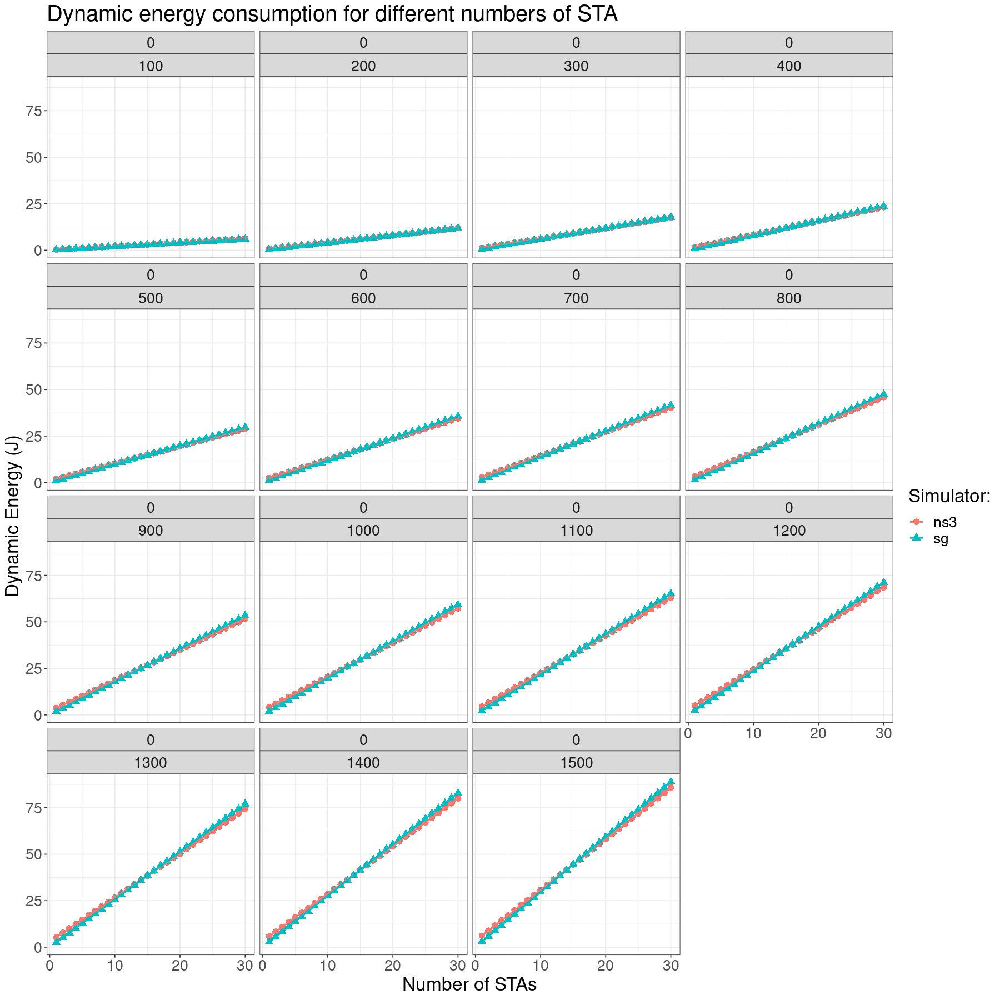

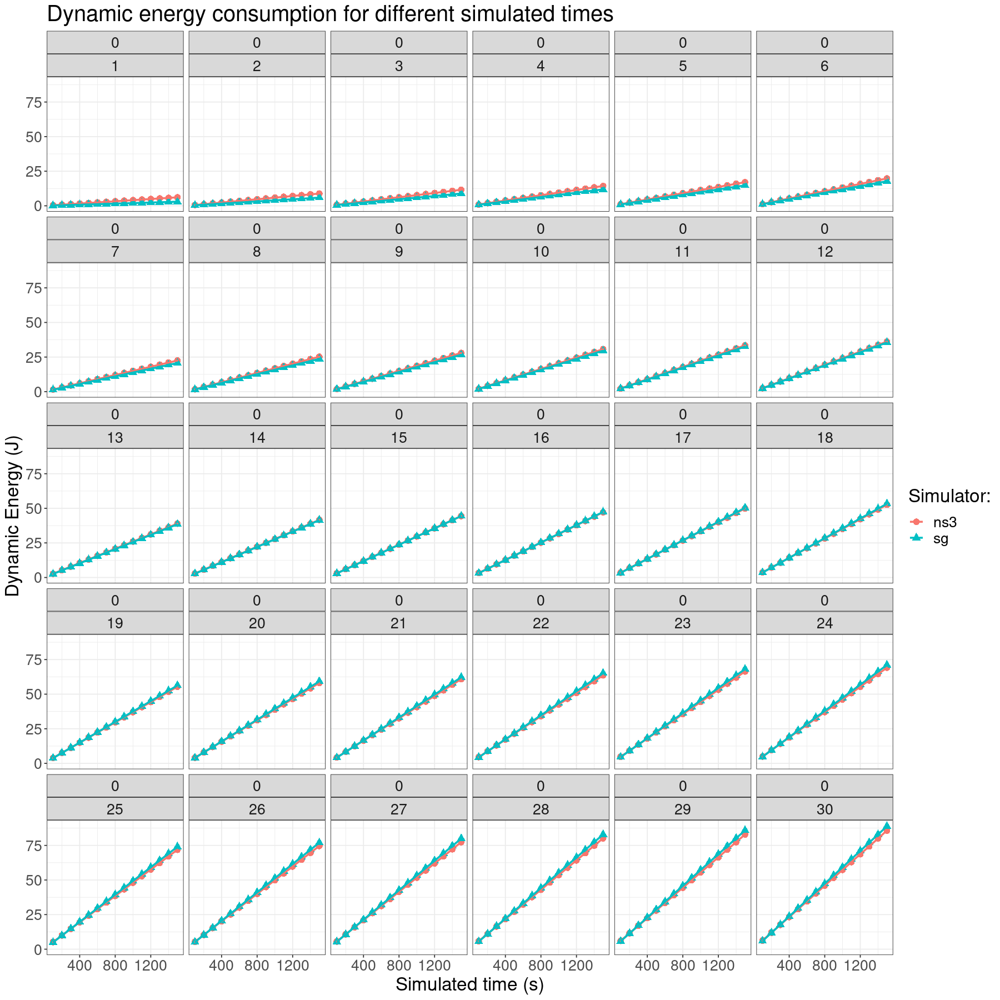

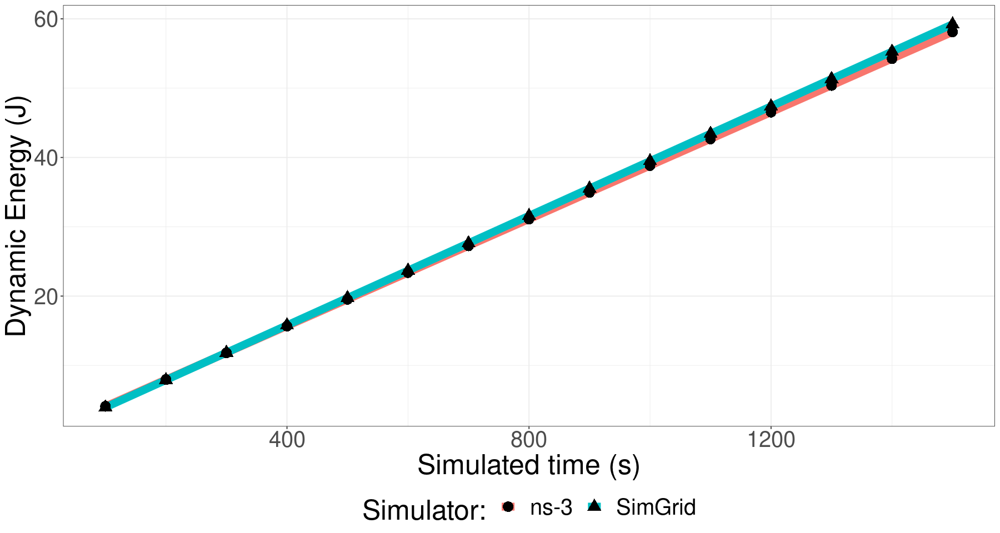

[1] 0.07052625
[1] 0.02759491


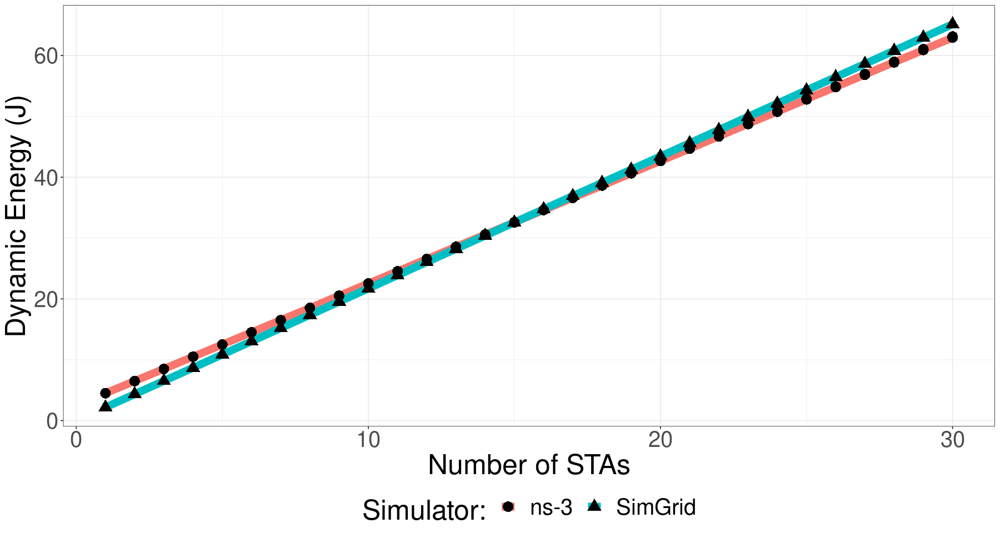

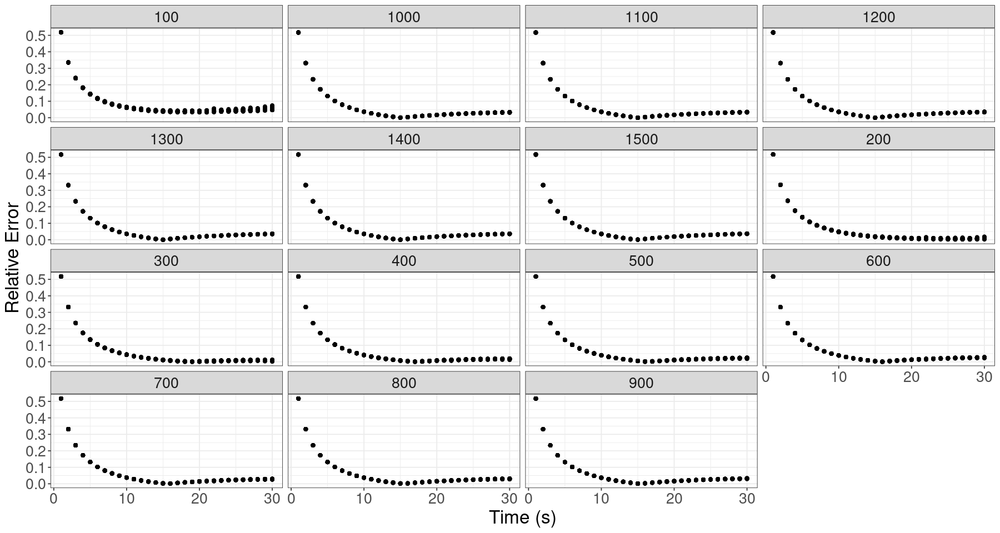

In [8]:
dir <- "./microbenchmarks/logs/"

d <- as_tibble(read.csv(paste(dir,"/results_1669831570_DEFAULT.csv",sep=""))) #/results_1662744076_DEFAULT.csv

dtmp <- d %>% filter(simulator=="ns3")
dsummary <- data_summary(d, varname="totEnergyConsumption", groupnames=c("simulator","nSTA","dataSize","simTime")) # standard deviation for errorbar

options(repr.plot.width=15, repr.plot.height=15)
g <- ggplot(data=d) +
  geom_point(aes(x=nSTA, y=totEnergyConsumption, color=simulator, shape=simulator), size=3)+
  geom_line(aes(x=nSTA, y=totEnergyConsumption, color=simulator), size=1)+
  theme_bw()+
  theme(text = element_text(size = 20))+
  labs(y= "Dynamic Energy (J)", x = "Number of STAs", color='Simulator:', shape='Simulator:') +
  facet_wrap(~dataSize+simTime) +
  ggtitle("Dynamic energy consumption for different numbers of STA")
g

options(repr.plot.width=15, repr.plot.height=15)
g <- ggplot(data=d) +
  geom_point(aes(x=simTime, y=totEnergyConsumption, color=simulator, shape=simulator), size=3)+
  geom_line(aes(x=simTime, y=totEnergyConsumption, color=simulator), size=1)+
  theme_bw()+
  theme(text = element_text(size = 20))+
  labs(y= "Dynamic Energy (J)", x = "Simulated time (s)", color='Simulator:', shape='Simulator:') +
  facet_wrap(~dataSize+nSTA)+
  ggtitle("Dynamic energy consumption for different simulated times")

g

# Figures used in the paper
dn <- d %>% filter(nSTA==20) %>% mutate(cleansimulator=ifelse(simulator=="ns3", "ns-3","SimGrid"))
options(repr.plot.width=15, repr.plot.height=8)
g <- ggplot(data=dn) +
  geom_line(aes(x=simTime, y=totEnergyConsumption, color=cleansimulator), size=4)+
  geom_point(aes(x=simTime, y=totEnergyConsumption, shape=cleansimulator), size=5)+
  theme_bw()+
  theme(text = element_text(size = 30), legend.position = "bottom")+
  labs(y= "Dynamic Energy (J)", x = "Simulated time (s)", color='Simulator:', shape='Simulator:') 
plot(g)

ggsave("calib_beacons.pdf", plot=g,width=15,height=6.5) #gsplit
embedFonts(file="calib_beacons.pdf", outfile="calib_beacons.pdf")

dn <- d %>% filter(simTime==1100) %>% mutate(cleansimulator=ifelse(simulator=="ns3", "ns-3","SimGrid"))
options(repr.plot.width=15, repr.plot.height=8)
g <- ggplot(data=dn) +
  geom_line(aes(x=nSTA, y=totEnergyConsumption, color=cleansimulator), size=4)+
  geom_point(aes(x=nSTA, y=totEnergyConsumption, shape=cleansimulator), size=5)+
  theme_bw()+
  theme(text = element_text(size = 30), legend.position = "bottom")+
  labs(y= "Dynamic Energy (J)", x = "Number of STAs", color='Simulator:', shape='Simulator:') 
plot(g)

ggsave("calib_beacons2.pdf", plot=g,width=15,height=6.5) #gsplit
embedFonts(file="calib_beacons2.pdf", outfile="calib_beacons2.pdf")


dErr <- data.frame(matrix(ncol = 7, nrow = 0))
n <- c("dataSize","nSTA","sim1", "en1", "sim2","en2","simTime")
colnames(dErr) <- n
for( j in rownames(d) ){
    if(strtoi(j)%%2==0) next
    jn <- strtoi(j)
    dErr[nrow(dErr) + 1,] = c(as.numeric(d[jn,]$dataSize),as.numeric(d[jn,]$nSTA),d[jn,]$simulator,as.numeric(d[jn,]$totEnergyConsumption),d[jn+1,]$simulator,as.numeric(d[jn+1,]$totEnergyConsumption),as.numeric(d[jn+1,]$simTime))
}
dErr$en1 <- as.numeric(dErr$en1)               # Third column is an integer
dErr$en2 <- as.numeric(dErr$en2)               # Third column is an integer
dErr$nSTA <- as.integer(dErr$nSTA)
dErr$dataSize <- as.integer(dErr$dataSize)

dErr <- dErr %>% mutate(relerr=abs((en2-en1)/(en1)))

print(mean(dErr$relerr))
print(median(dErr$relerr))

g2 <- ggplot() + 
  geom_point(data=dErr, aes(x=nSTA, y=relerr))+
  facet_wrap(~simTime)+
  theme_bw()+
  theme(text = element_text(size = 20))+
  labs(y= "Relative Error", x = "Time (s)")
plot(g2)




<a id="sc0-2"></a>
## Overall energy consumption

The logs obtained by running this experiment are in the archive: `logs/1669833556.tar.xz`, the parsed results in `logs/results_1669833556_DEFAULT.csv`

### Settings

Launcher file name: `run_control_frames_tot.sh`

Launcher options:
```sh
bitRates="44.23Mbps" # bitRate in SimGrid in Mbps (obtained from the final plot of ns-3 values)
useNS3=1
local_only=0
name="calibration_control_frames_tot"
useDecayModel=0
threshRTSCTS=100
seeds="$(seq 1 1 100)"
radiuses=15
simTimes="$(seq 100 100 1500)"
corrF=0.0021
upDown=2
biDirection=-1
cancelIDLEEnergy=0
pcap=0
mcs="HtMcs3"

dataSizes=0
topos=2
flowConfs=0 # Not used
nNodes=$(seq 1 1 30)
nNodePairs=0 # Not used
```
## Results

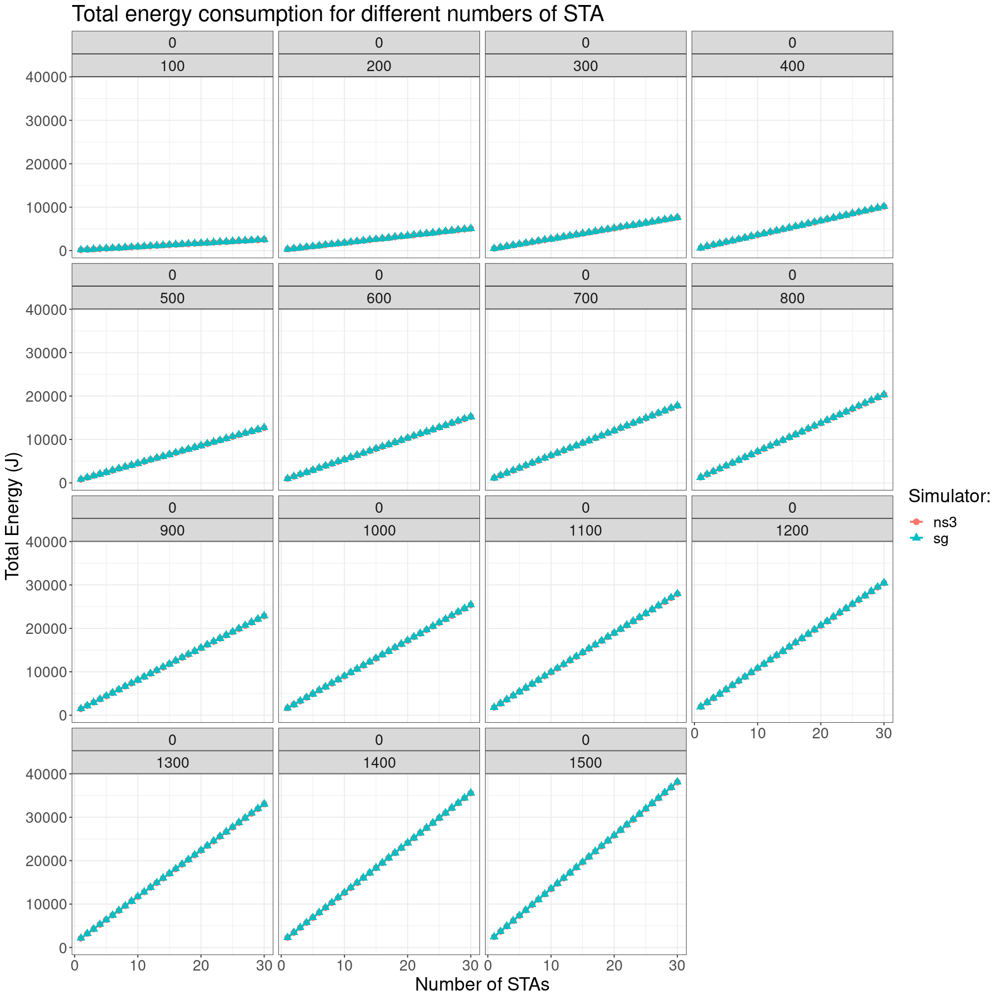

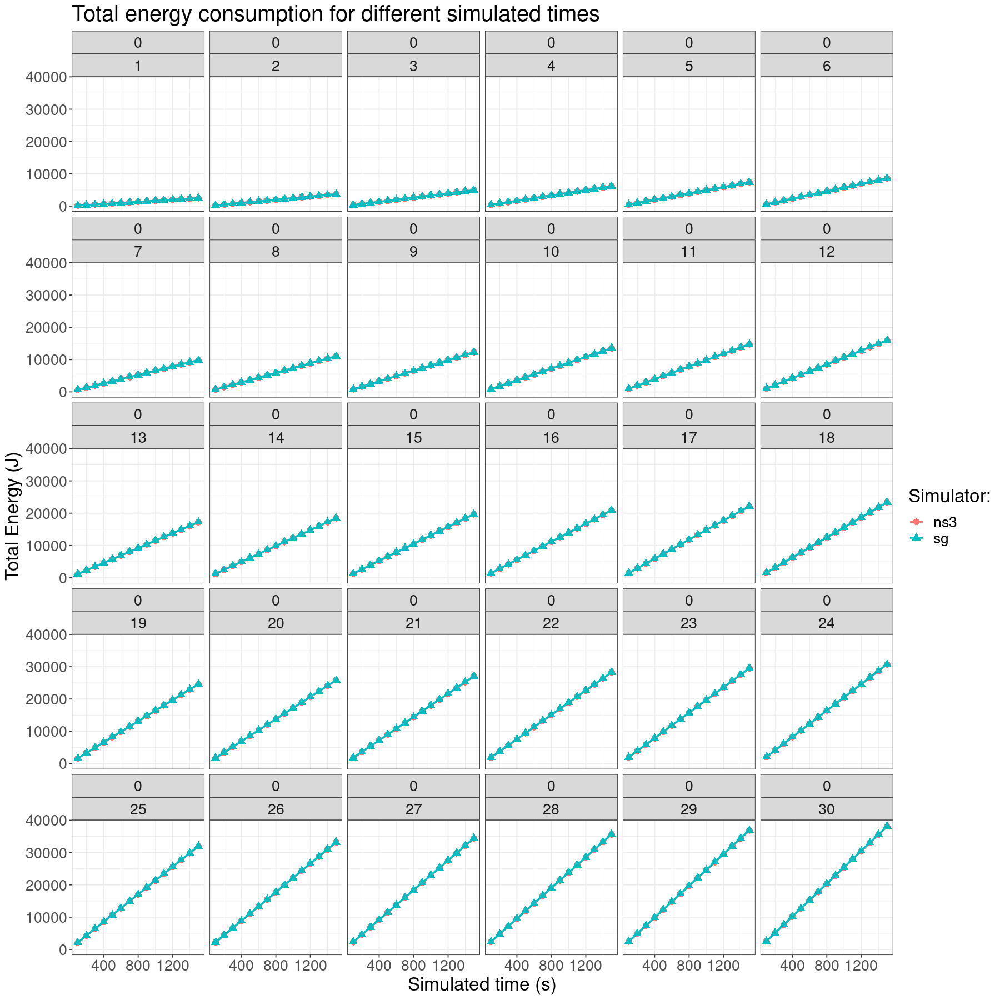

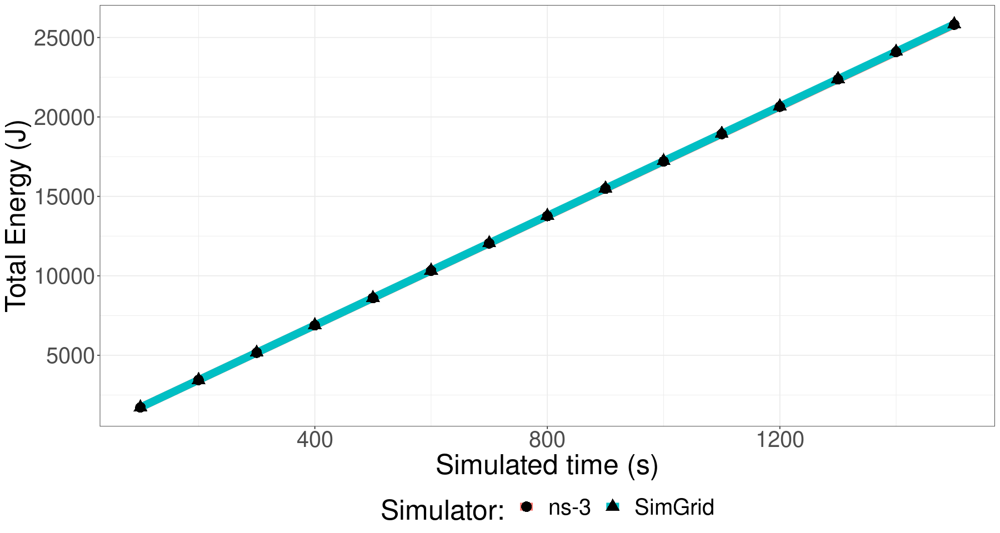

[1] 0.0009805756
[1] 0.001085012


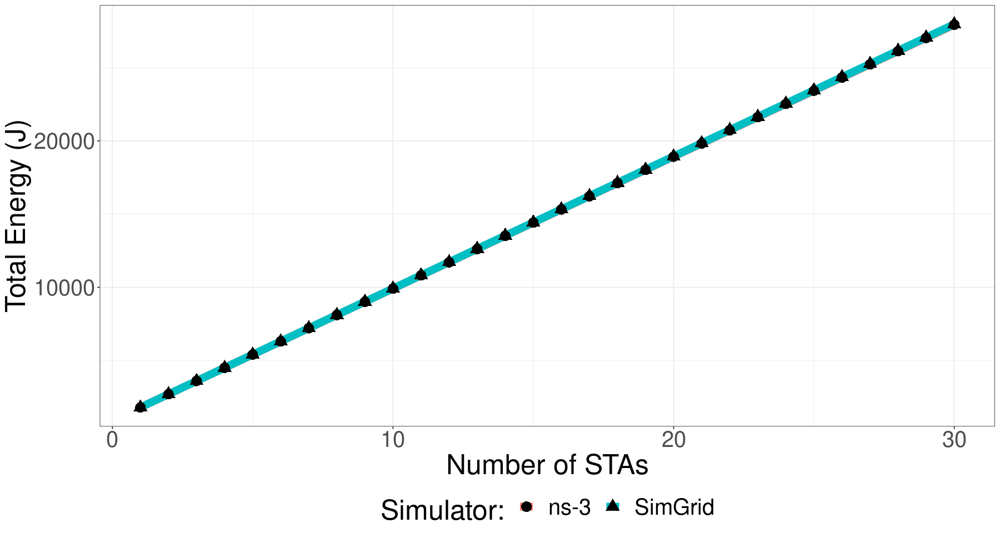

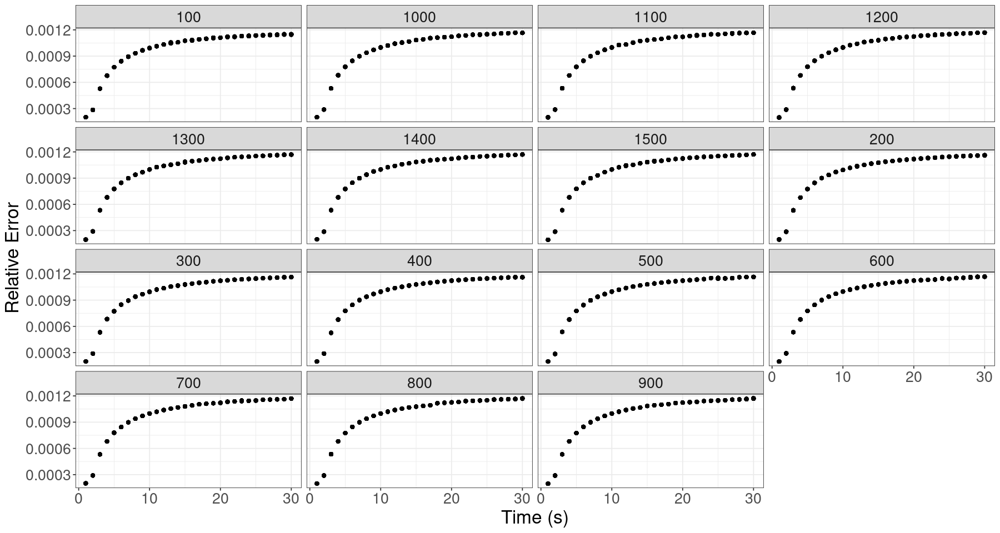

In [9]:
dir <- "./microbenchmarks/logs/"

d <- as_tibble(read.csv(paste(dir,"/results_1669833556_DEFAULT.csv",sep=""))) #/results_1662744076_DEFAULT.csv

#d <- d %>% filter(simulator=="ns3")
dtmp <- d %>% filter(simulator=="ns3")
dsummary <- data_summary(d, varname="totEnergyConsumption", groupnames=c("simulator","nSTA","dataSize","simTime")) # standard deviation for errorbar

options(repr.plot.width=15, repr.plot.height=15)
g <- ggplot(data=d) +
  geom_point(aes(x=nSTA, y=totEnergyConsumption, color=simulator, shape=simulator), size=3)+
  geom_line(aes(x=nSTA, y=totEnergyConsumption, color=simulator), size=1)+
  theme_bw()+
  theme(text = element_text(size = 20))+
  labs(y= "Total Energy (J)", x = "Number of STAs", color='Simulator:', shape='Simulator:') +
  facet_wrap(~dataSize+simTime) +
  ggtitle("Total energy consumption for different numbers of STA")
g

options(repr.plot.width=15, repr.plot.height=15)
g <- ggplot(data=d) +
  geom_point(aes(x=simTime, y=totEnergyConsumption, color=simulator, shape=simulator), size=3)+
  geom_line(aes(x=simTime, y=totEnergyConsumption, color=simulator), size=1)+
  theme_bw()+
  theme(text = element_text(size = 20))+
  labs(y= "Total Energy (J)", x = "Simulated time (s)", color='Simulator:', shape='Simulator:') +
  facet_wrap(~dataSize+nSTA)+
  ggtitle("Total energy consumption for different simulated times")

g

# Figures used in the paper
dn <- d %>% filter(nSTA==20) %>% mutate(cleansimulator=ifelse(simulator=="ns3", "ns-3","SimGrid"))
options(repr.plot.width=15, repr.plot.height=8)
g <- ggplot(data=dn) +
  geom_line(aes(x=simTime, y=totEnergyConsumption, color=cleansimulator), size=4)+
  geom_point(aes(x=simTime, y=totEnergyConsumption, shape=cleansimulator), size=5)+
  theme_bw()+
  theme(text = element_text(size = 30), legend.position = "bottom")+
  labs(y= "Total Energy (J)", x = "Simulated time (s)", color='Simulator:', shape='Simulator:') 
plot(g)

ggsave("calib_beacons_tot.pdf", plot=g,width=15,height=6.5) #gsplit
embedFonts(file="calib_beacons_tot.pdf", outfile="calib_beacons.pdf")

dn <- d %>% filter(simTime==1100) %>% mutate(cleansimulator=ifelse(simulator=="ns3", "ns-3","SimGrid"))
options(repr.plot.width=15, repr.plot.height=8)
g <- ggplot(data=dn) +
  geom_line(aes(x=nSTA, y=totEnergyConsumption, color=cleansimulator), size=4)+
  geom_point(aes(x=nSTA, y=totEnergyConsumption, shape=cleansimulator), size=5)+
  theme_bw()+
  theme(text = element_text(size = 30), legend.position = "bottom")+
  labs(y= "Total Energy (J)", x = "Number of STAs", color='Simulator:', shape='Simulator:') 
plot(g)

ggsave("calib_beacons2_tot.pdf", plot=g,width=15,height=6.5) #gsplit
embedFonts(file="calib_beacons2_tot.pdf", outfile="calib_beacons2.pdf")


dErr <- data.frame(matrix(ncol = 7, nrow = 0))
n <- c("dataSize","nSTA","sim1", "en1", "sim2","en2","simTime")
colnames(dErr) <- n
for( j in rownames(d) ){
    if(strtoi(j)%%2==0) next
    jn <- strtoi(j)
    dErr[nrow(dErr) + 1,] = c(as.numeric(d[jn,]$dataSize),as.numeric(d[jn,]$nSTA),d[jn,]$simulator,as.numeric(d[jn,]$totEnergyConsumption),d[jn+1,]$simulator,as.numeric(d[jn+1,]$totEnergyConsumption),as.numeric(d[jn+1,]$simTime))
}
dErr$en1 <- as.numeric(dErr$en1)               # Third column is an integer
dErr$en2 <- as.numeric(dErr$en2)               # Third column is an integer
dErr$nSTA <- as.integer(dErr$nSTA)
dErr$dataSize <- as.integer(dErr$dataSize)

dErr <- dErr %>% mutate(relerr=abs((en2-en1)/(en1)))

print(mean(dErr$relerr))
print(median(dErr$relerr))

g2 <- ggplot() + 
  geom_point(data=dErr, aes(x=nSTA, y=relerr))+
  facet_wrap(~simTime)+
  theme_bw()+
  theme(text = element_text(size = 20))+
  labs(y= "Relative Error", x = "Time (s)")
plot(g2)




<a id="sc1"></a>
# Scenario 1: Unidir down

## Preview

![Scenario_preview](../scenarios/scenario_unidir_down.png)


<a id="sc1-1"></a>
## Dynamic energy consumption

The logs obtained by running this experiment are in the archive: `logs/1669944763.tar.xz`, the parsed results in `logs/results_1669944763_DEFAULT.csv`

## Settings

Launcher file name: `run_single_down_unidir_dyn.sh`

Launcher options:

```sh
bitRates="44.23Mbps" # bitRate in SimGrid in Mbps (obtained from the final plot of ns-3 values)
useNS3=1
local_only=0
name="unidir_down_dyn"
useDecayModel=0
threshRTSCTS=100
seeds="$(seq 1 1 100)"
radiuses=15
simTimes="600"
corrF="0.0021"
upDown=0
biDirection=0
cancelIDLEEnergy=1
pcap=0
mcs="HtMcs3"

dataSizes="$(seq 10000 1000000 30000000)"
topos=2
flowConfs=0 # Not used
nNodes=$(seq 1 1 20)
nNodePairs=0 # Not used
```

## Results

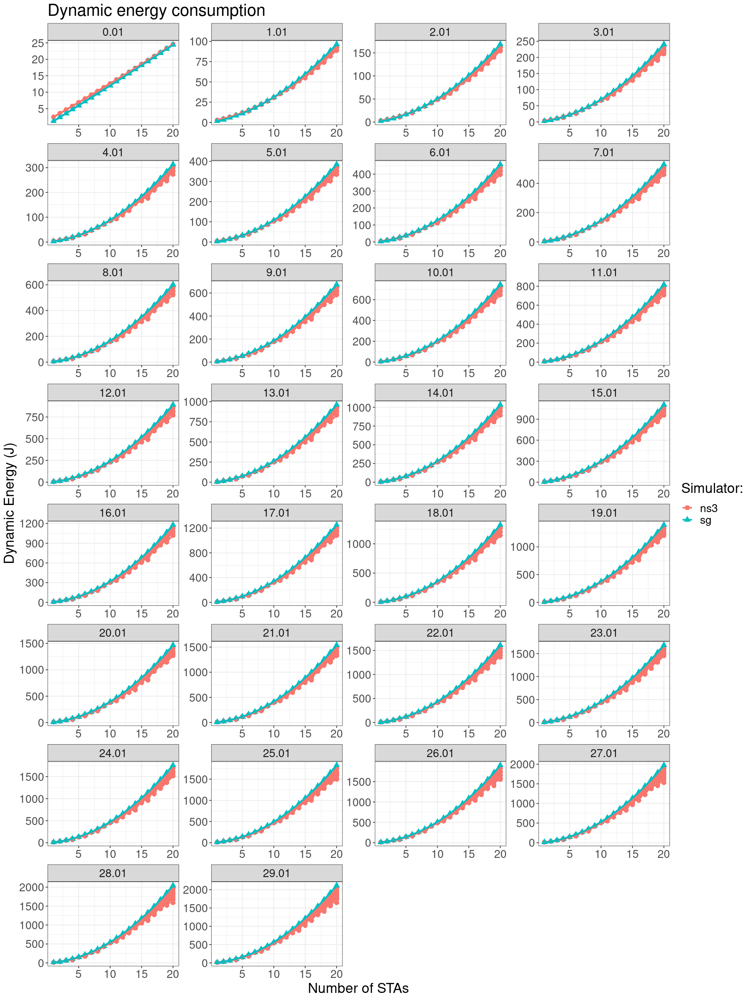

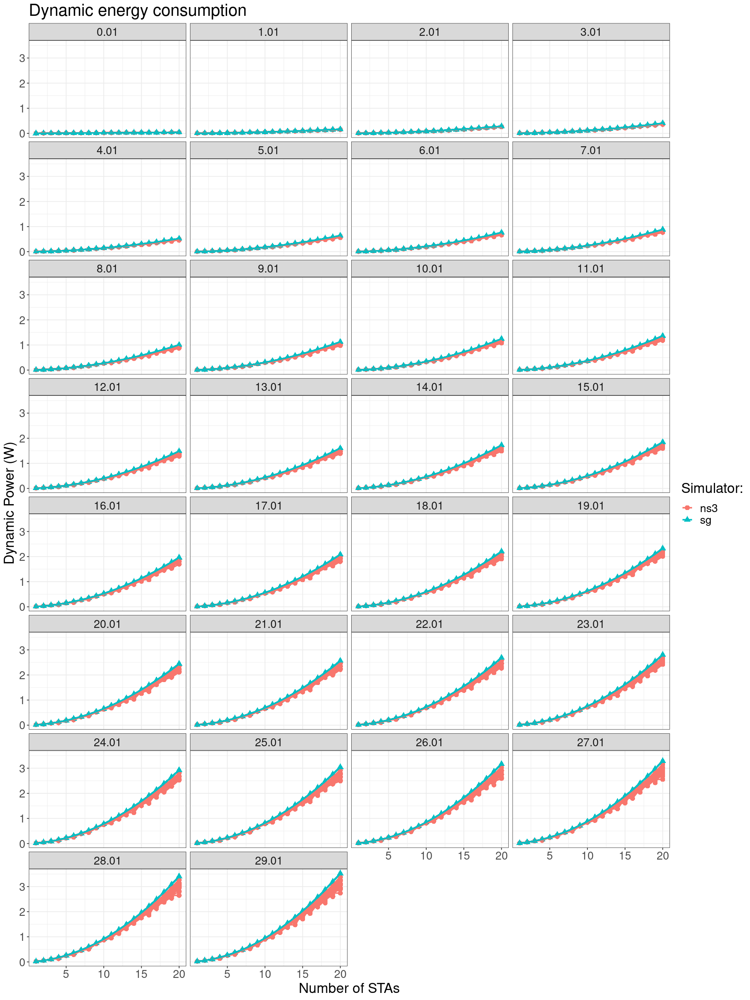

[1] 0.05223246


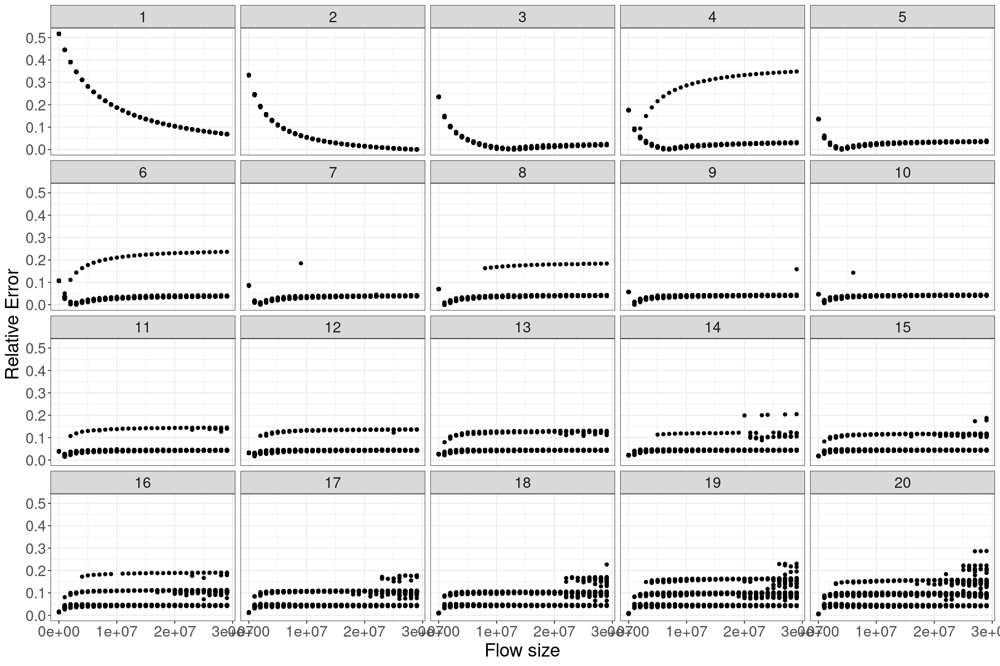

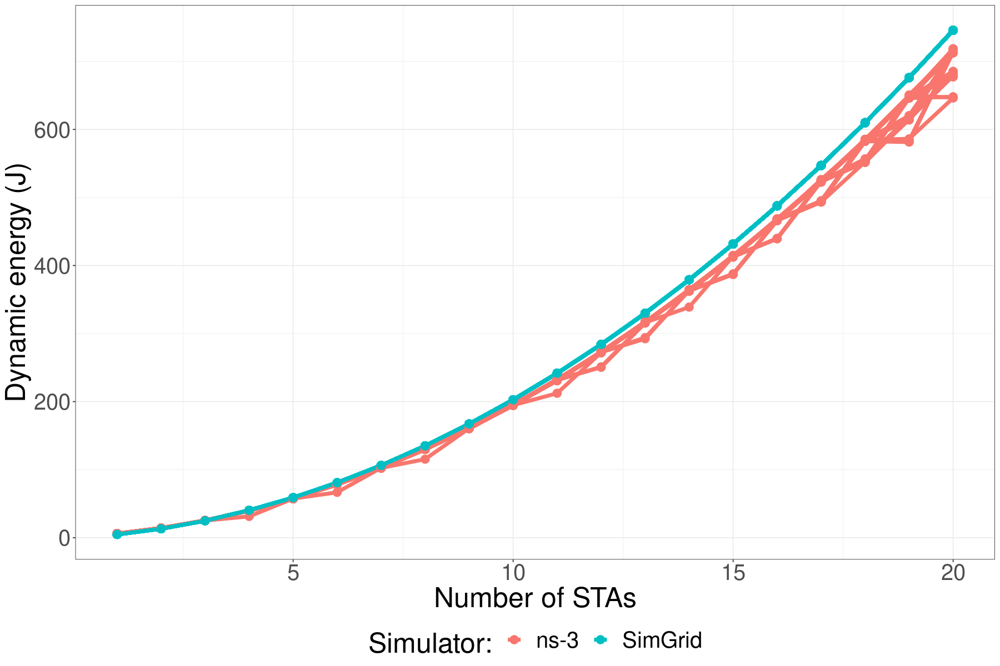

In [15]:
dir <- "./microbenchmarks/logs/"

d <- as_tibble(read.csv(paste(dir,"/results_1669944763_DEFAULT.csv",sep="")))

options(repr.plot.width=15, repr.plot.height=20)
g <- ggplot(data=d) +
  geom_point(aes(x=nSTA, y=totEnergyConsumption, group=interaction(simulator,factor(seed)), color=simulator, shape=simulator), size=3)+
  geom_line(aes(x=nSTA, y=totEnergyConsumption, group=interaction(simulator,factor(seed)), color=simulator), size=1)+
  facet_wrap(~(dataSize/1e+6), ncol=4, scales="free")+
  theme_bw()+
  theme(text = element_text(size = 20))+
  labs(y= "Dynamic Energy (J)", x = "Number of STAs", color='Simulator:', shape='Simulator:') +
  ggtitle("Dynamic energy consumption")
g

options(repr.plot.width=15, repr.plot.height=20)
g <- ggplot(data=d) +
  geom_point(aes(x=nSTA, y=totEnergyConsumption/simTime, group=interaction(simulator,factor(seed)), color=simulator, shape=simulator), size=3)+
  geom_line(aes(x=nSTA, y=totEnergyConsumption/simTime, group=interaction(simulator,factor(seed)), color=simulator), size=1)+
  facet_wrap(~(dataSize/1e+6), ncol=4)+
  theme_bw()+
  theme(text = element_text(size = 20))+
  labs(y= "Dynamic Power (W)", x = "Number of STAs", color='Simulator:', shape='Simulator:')+
  ggtitle("Dynamic energy consumption")
g


options(repr.plot.width=15, repr.plot.height=10)

dErr <- data.frame(matrix(ncol = 6, nrow = 0))
n <- c("dataSize","nSTA","sim1", "en1", "sim2","en2")
colnames(dErr) <- n
for( j in rownames(d) ){
    if(strtoi(j)%%2==0) next
    jn <- strtoi(j)
    dErr[nrow(dErr) + 1,] = c(as.numeric(d[jn,]$dataSize),as.numeric(d[jn,]$nSTA),d[jn,]$simulator,as.numeric(d[jn,]$totEnergyConsumption),d[jn+1,]$simulator,as.numeric(d[jn+1,]$totEnergyConsumption))
}
dErr$en1 <- as.numeric(dErr$en1)               # Third column is an integer
dErr$en2 <- as.numeric(dErr$en2)               # Third column is an integer
dErr$nSTA <- as.integer(dErr$nSTA)
dErr$dataSize <- as.integer(dErr$dataSize)

dErr <- dErr %>% mutate(relerr=abs((en2-en1)/(en1)))
g2 <- ggplot() + 
  geom_point(data=dErr, aes(x=dataSize, y=relerr))+
  facet_wrap(~nSTA)+
  theme_bw()+
  theme(text = element_text(size = 20))+
  labs(y= "Relative Error", x = "Flow size")
g2


print(mean(dErr$relerr))

d <- d %>% filter(dataSize==10010000) %>% mutate(cleansimulator=ifelse(simulator=="ns3", "ns-3","SimGrid"))

options(repr.plot.width=15, repr.plot.height=10)
g <- ggplot(data=d, aes(x=nSTA, y=totEnergyConsumption, group=interaction(simulator,seed), color=cleansimulator, fill=cleansimulator)) +
  geom_line(size=2, aes(color=cleansimulator))+geom_point(size=4, aes(color=cleansimulator))+
  labs(y= "Dynamic energy (J)", x = "Number of STAs", color='Simulator:', fill='Simulator:')+
  theme_bw()+
  theme(text = element_text(size = 30), legend.position = "bottom")
g

ggsave("power_down_dyn.pdf", plot=g,width=15,height=10) #gsplit
embedFonts(file="power_down_dyn.pdf", outfile="power_down_dyn.pdf")


<a id="sc1-2"></a>
## Overall energy consumption

The logs obtained by running this experiment are in the archive: `logs/1669931271.tar.xz`, the parsed results in `logs/results_1669931271_DEFAULT.csv`

## Settings

Launcher file name: `run_single_down_unidir_tot.sh`

Launcher options:

```sh
bitRates="44.23Mbps" # bitRate in SimGrid in Mbps (obtained from the final plot of ns-3 values)
useNS3=1
local_only=0
name="unidir_down_tot"
useDecayModel=0
threshRTSCTS=100
seeds="$(seq 1 1 100)"
radiuses=15
simTimes="600"
corrF="0.0021"
upDown=0
biDirection=0
cancelIDLEEnergy=0
pcap=0
mcs="HtMcs3"

dataSizes="$(seq 10000 1000000 30000000)"
topos=2
flowConfs=0 # Not used
nNodes=$(seq 1 1 20)
nNodePairs=0 # Not used
```

## Results

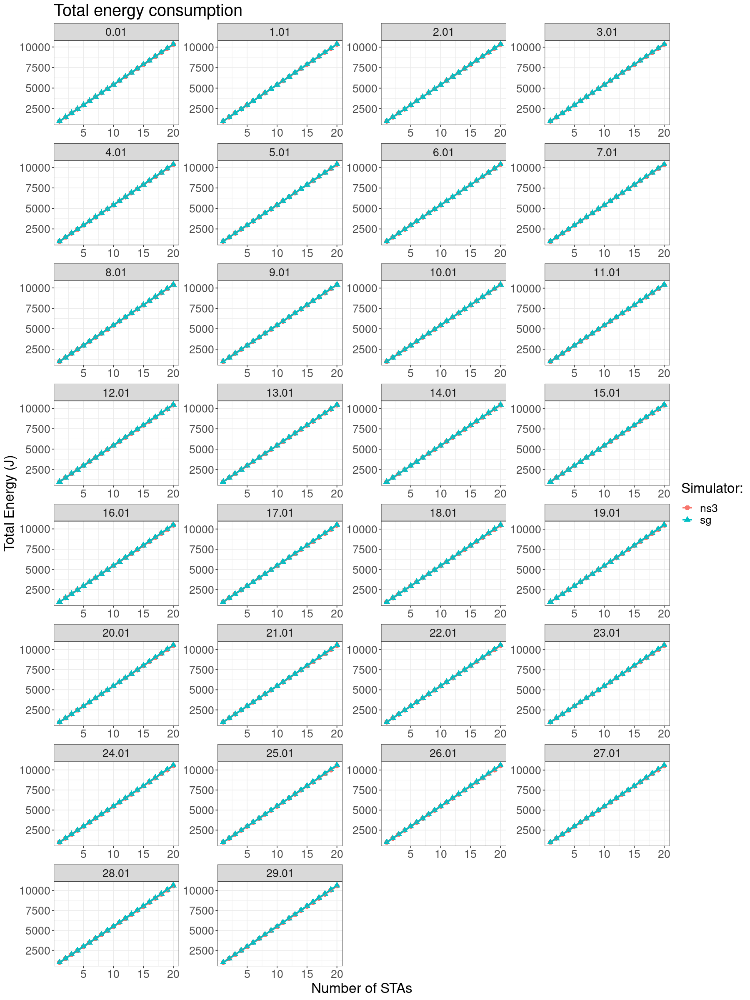

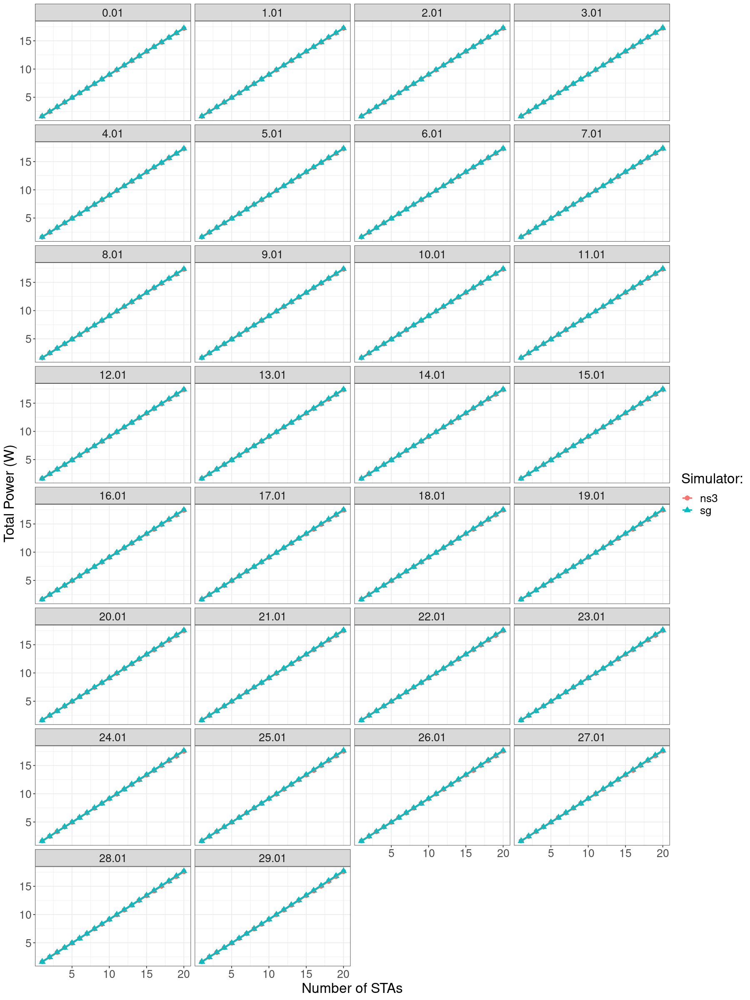

[1] 0.00152315


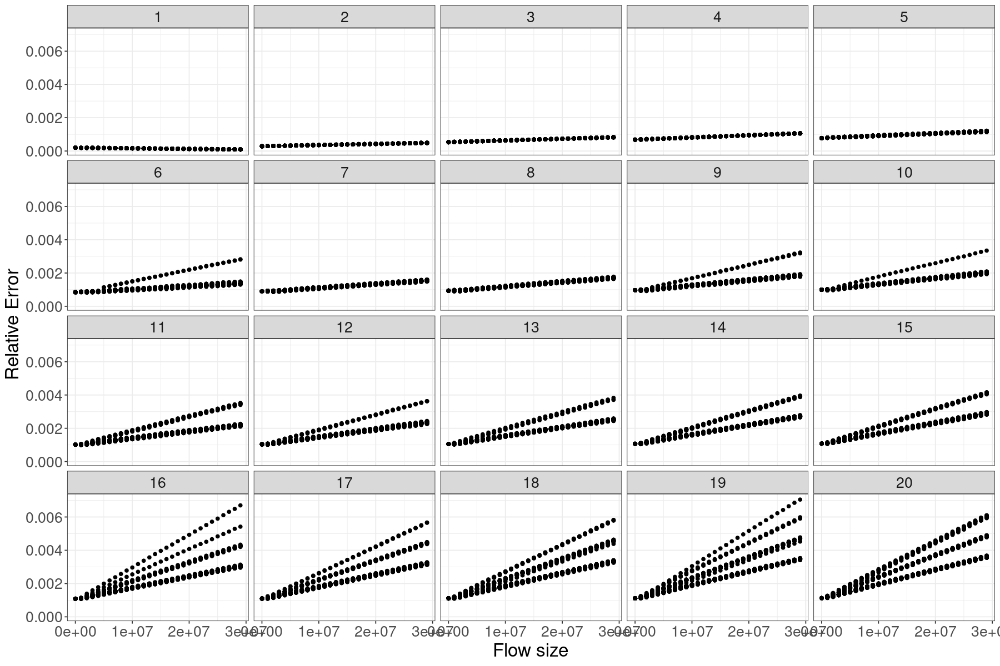

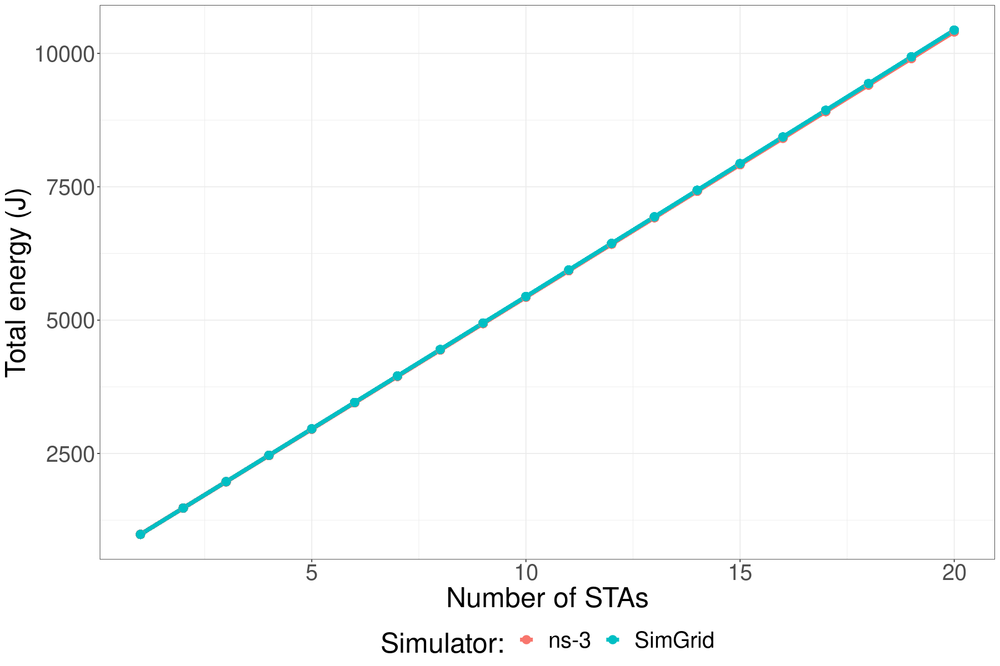

In [16]:
dir <- "./microbenchmarks/logs/"

d <- as_tibble(read.csv(paste(dir,"/results_1669931271_DEFAULT.csv",sep="")))

options(repr.plot.width=15, repr.plot.height=20)
g <- ggplot(data=d) +
  geom_point(aes(x=nSTA, y=totEnergyConsumption, group=interaction(simulator,factor(seed)), color=simulator, shape=simulator), size=3)+
  geom_line(aes(x=nSTA, y=totEnergyConsumption, group=interaction(simulator,factor(seed)), color=simulator), size=1)+
  facet_wrap(~(dataSize/1e+6), ncol=4, scales="free")+
  theme_bw()+
  theme(text = element_text(size = 20))+
  labs(y= "Total Energy (J)", x = "Number of STAs", color='Simulator:', shape='Simulator:') +
  ggtitle("Total energy consumption")
g

options(repr.plot.width=15, repr.plot.height=20)
g <- ggplot(data=d) +
  geom_point(aes(x=nSTA, y=totEnergyConsumption/simTime, group=interaction(simulator,factor(seed)), color=simulator, shape=simulator), size=3)+
  geom_line(aes(x=nSTA, y=totEnergyConsumption/simTime, group=interaction(simulator,factor(seed)), color=simulator), size=1)+
  facet_wrap(~(dataSize/1e+6), ncol=4)+
  theme_bw()+
  theme(text = element_text(size = 20))+
  labs(y= "Total Power (W)", x = "Number of STAs", color='Simulator:', shape='Simulator:')
g


options(repr.plot.width=15, repr.plot.height=10)

dErr <- data.frame(matrix(ncol = 6, nrow = 0))
n <- c("dataSize","nSTA","sim1", "en1", "sim2","en2")
colnames(dErr) <- n
for( j in rownames(d) ){
    if(strtoi(j)%%2==0) next
    jn <- strtoi(j)
    dErr[nrow(dErr) + 1,] = c(as.numeric(d[jn,]$dataSize),as.numeric(d[jn,]$nSTA),d[jn,]$simulator,as.numeric(d[jn,]$totEnergyConsumption),d[jn+1,]$simulator,as.numeric(d[jn+1,]$totEnergyConsumption))
}
dErr$en1 <- as.numeric(dErr$en1)               # Third column is an integer
dErr$en2 <- as.numeric(dErr$en2)               # Third column is an integer
dErr$nSTA <- as.integer(dErr$nSTA)
dErr$dataSize <- as.integer(dErr$dataSize)

dErr <- dErr %>% mutate(relerr=abs((en2-en1)/(en1)))
g2 <- ggplot() + 
  geom_point(data=dErr, aes(x=dataSize, y=relerr))+
  facet_wrap(~nSTA)+
  theme_bw()+
  theme(text = element_text(size = 20))+
  labs(y= "Relative Error", x = "Flow size")
g2


print(mean(dErr$relerr))

d <- d %>% filter(dataSize==10010000) %>% mutate(cleansimulator=ifelse(simulator=="ns3", "ns-3","SimGrid"))

options(repr.plot.width=15, repr.plot.height=10)
g <- ggplot(data=d, aes(x=nSTA, y=totEnergyConsumption, group=interaction(cleansimulator,seed), color=cleansimulator, fill=cleansimulator)) +
  geom_line(size=2, aes(color=cleansimulator))+geom_point(size=4, aes(color=cleansimulator))+
  labs(y= "Total energy (J)", x = "Number of STAs", color='Simulator:', fill='Simulator:')+
  theme_bw()+
  theme(text = element_text(size = 30), legend.position = "bottom")
g

ggsave("power_down_tot.pdf", plot=g,width=15,height=10) #gsplit
embedFonts(file="power_down_tot.pdf", outfile="power_down_tot.pdf")


<a id="sc2"></a>
# Scenario 1: Unidir Up

## Preview

![Scenario_preview](../scenarios/scenario_unidir_up.png)


<a id="sc2-1"></a>
## Dynamic energy consumption

The logs obtained by running this experiment are in the archive: `logs/1670004313.tar.xz`, the parsed results in `logs/results_1670004313_DEFAULT.csv`

## Settings

Launcher file name: `run_single_up_unidir_dyn.sh`

Launcher options:

```sh
bitRates="44.23Mbps" # bitRate in SimGrid in Mbps (obtained from the final plot of ns
-3 values)
useNS3=1
local_only=0
name="unidir_down_dyn"
useDecayModel=0
threshRTSCTS=100
seeds="$(seq 1 1 100)"
radiuses=15
simTimes="600"
corrF="0.0021"
upDown=1
biDirection=0
cancelIDLEEnergy=1
pcap=0
mcs="HtMcs3"

dataSizes="$(seq 10000 1000000 30000000)"
topos=2
flowConfs=0 # Not used
nNodes=$(seq 1 1 20)
nNodePairs=0 # Not used
```

## Results

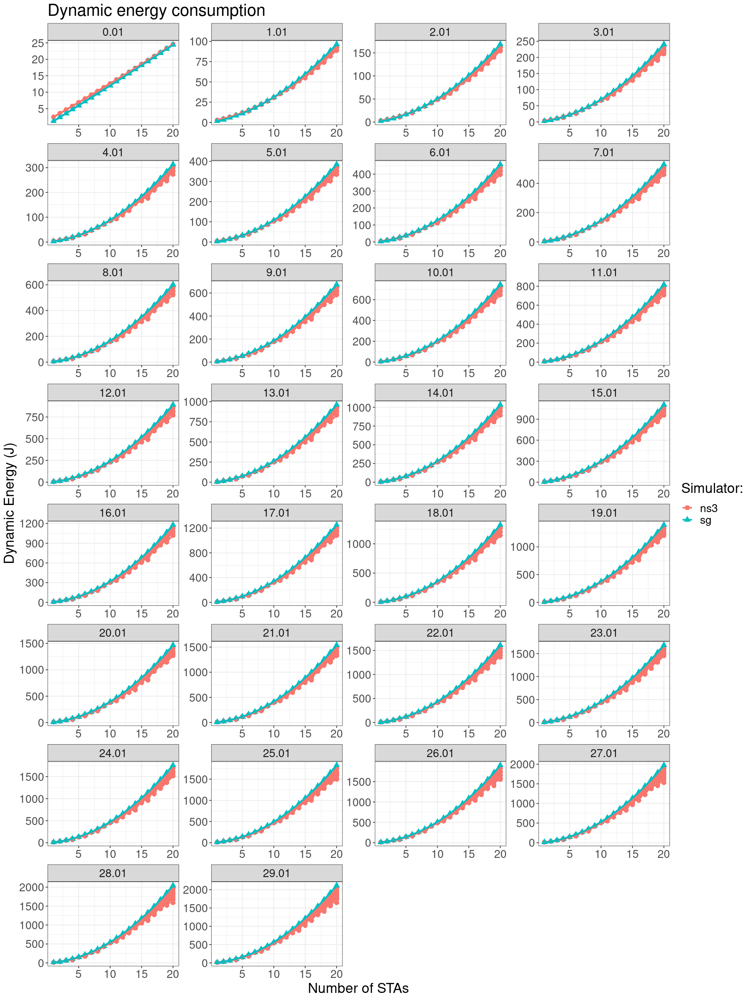

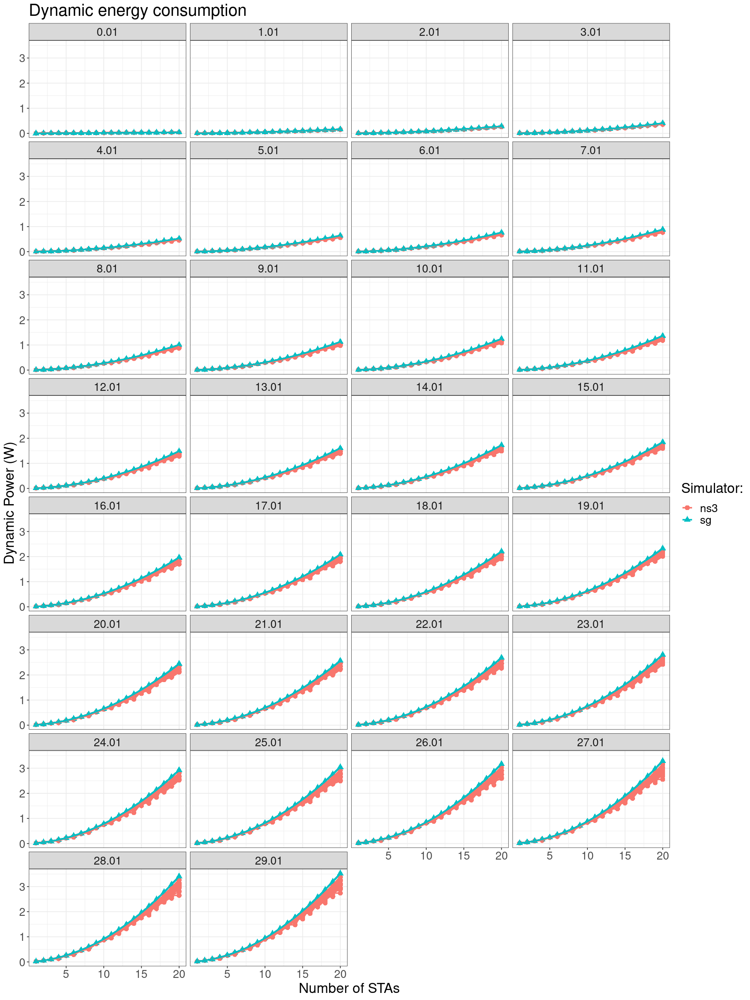

[1] 0.05223246


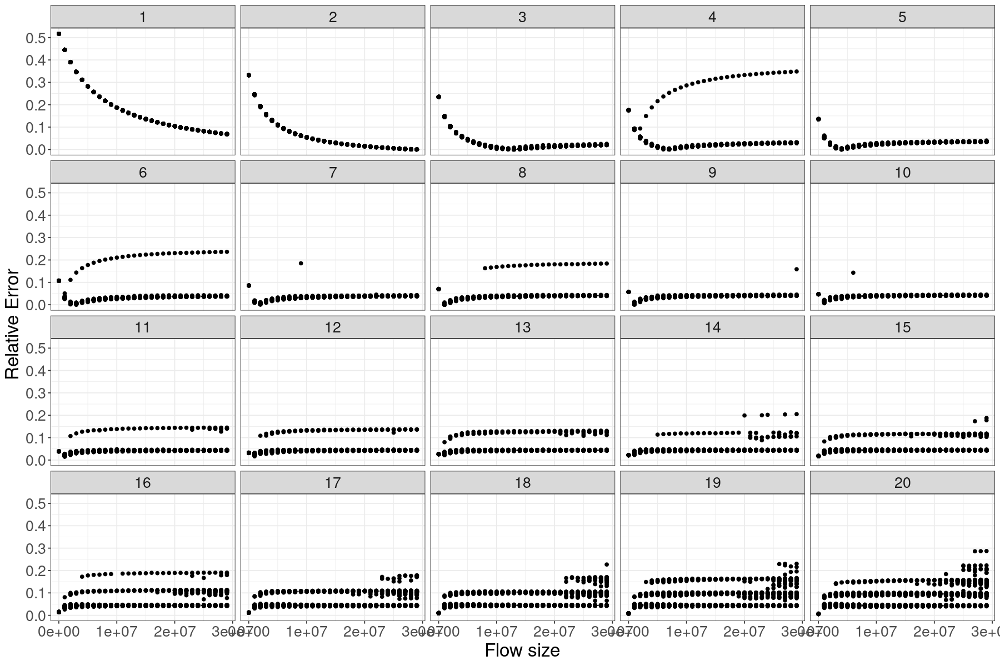

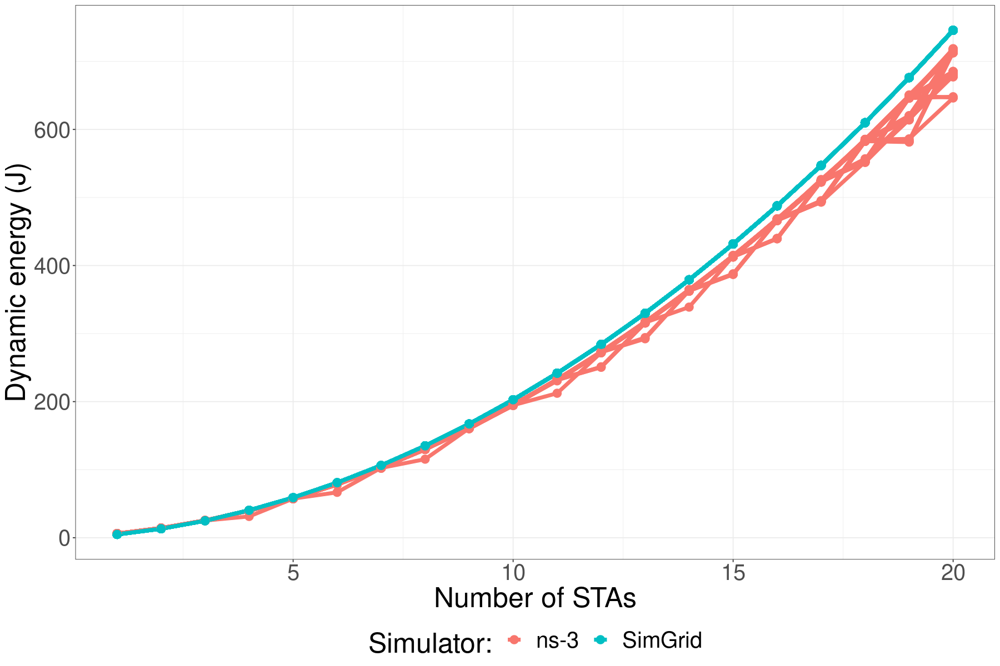

In [14]:
dir <- "./microbenchmarks/logs/"

d <- as_tibble(read.csv(paste(dir,"/results_1670004313_DEFAULT.csv",sep="")))

options(repr.plot.width=15, repr.plot.height=20)
g <- ggplot(data=d) +
  geom_point(aes(x=nSTA, y=totEnergyConsumption, group=interaction(simulator,factor(seed)), color=simulator, shape=simulator), size=3)+
  geom_line(aes(x=nSTA, y=totEnergyConsumption, group=interaction(simulator,factor(seed)), color=simulator), size=1)+
  facet_wrap(~(dataSize/1e+6), ncol=4, scales="free")+
  theme_bw()+
  theme(text = element_text(size = 20))+
  labs(y= "Dynamic Energy (J)", x = "Number of STAs", color='Simulator:', shape='Simulator:') +
  ggtitle("Dynamic energy consumption")
g

options(repr.plot.width=15, repr.plot.height=20)
g <- ggplot(data=d) +
  geom_point(aes(x=nSTA, y=totEnergyConsumption/simTime, group=interaction(simulator,factor(seed)), color=simulator, shape=simulator), size=3)+
  geom_line(aes(x=nSTA, y=totEnergyConsumption/simTime, group=interaction(simulator,factor(seed)), color=simulator), size=1)+
  facet_wrap(~(dataSize/1e+6), ncol=4)+
  theme_bw()+
  theme(text = element_text(size = 20))+
  labs(y= "Dynamic Power (W)", x = "Number of STAs", color='Simulator:', shape='Simulator:')+
  ggtitle("Dynamic energy consumption")
g


options(repr.plot.width=15, repr.plot.height=10)

dErr <- data.frame(matrix(ncol = 6, nrow = 0))
n <- c("dataSize","nSTA","sim1", "en1", "sim2","en2")
colnames(dErr) <- n
for( j in rownames(d) ){
    if(strtoi(j)%%2==0) next
    jn <- strtoi(j)
    dErr[nrow(dErr) + 1,] = c(as.numeric(d[jn,]$dataSize),as.numeric(d[jn,]$nSTA),d[jn,]$simulator,as.numeric(d[jn,]$totEnergyConsumption),d[jn+1,]$simulator,as.numeric(d[jn+1,]$totEnergyConsumption))
}
dErr$en1 <- as.numeric(dErr$en1)               # Third column is an integer
dErr$en2 <- as.numeric(dErr$en2)               # Third column is an integer
dErr$nSTA <- as.integer(dErr$nSTA)
dErr$dataSize <- as.integer(dErr$dataSize)

dErr <- dErr %>% mutate(relerr=abs((en2-en1)/(en1)))
g2 <- ggplot() + 
  geom_point(data=dErr, aes(x=dataSize, y=relerr))+
  facet_wrap(~nSTA)+
  theme_bw()+
  theme(text = element_text(size = 20))+
  labs(y= "Relative Error", x = "Flow size")
g2


print(mean(dErr$relerr))

d <- d %>% filter(dataSize==10010000) %>% mutate(cleansimulator=ifelse(simulator=="ns3", "ns-3","SimGrid"))

options(repr.plot.width=15, repr.plot.height=10)
g <- ggplot(data=d, aes(x=nSTA, y=totEnergyConsumption, group=interaction(cleansimulator,seed), color=cleansimulator, fill=cleansimulator)) +
  geom_line(size=2, aes(color=cleansimulator))+geom_point(size=4, aes(color=cleansimulator))+
  labs(y= "Dynamic energy (J)", x = "Number of STAs", color='Simulator:', fill='Simulator:')+
  theme_bw()+
  theme(text = element_text(size = 30), legend.position = "bottom")
g

ggsave("power_up_dyn.pdf", plot=g,width=15,height=10) #gsplit
embedFonts(file="power_up_dyn.pdf", outfile="power_up_dyn.pdf")


<a id="sc2-2"></a>
## Overall energy consumption

The logs obtained by running this experiment are in the archive: `logs/1670017461.tar.xz`, the parsed results in `logs/results_1670017461_DEFAULT.csv`

## Settings

Launcher file name: `run_single_up_unidir_tot.sh`

Launcher options:

```sh
bitRates="44.23Mbps" # bitRate in SimGrid in Mbps (obtained from the final plot of ns-3 values)
useNS3=1
local_only=0
name="unidir_down_dyn"
useDecayModel=0
threshRTSCTS=100   
seeds="$(seq 1 1 100)"
radiuses=15
simTimes="600"
corrF="0.0021"
upDown=1
biDirection=0
cancelIDLEEnergy=0 
pcap=0
mcs="HtMcs3"

dataSizes="$(seq 10000 1000000 30000000)"
topos=2
flowConfs=0 # Not used
nNodes=$(seq 1 1 20)
nNodePairs=0 # Not used
```

## Results

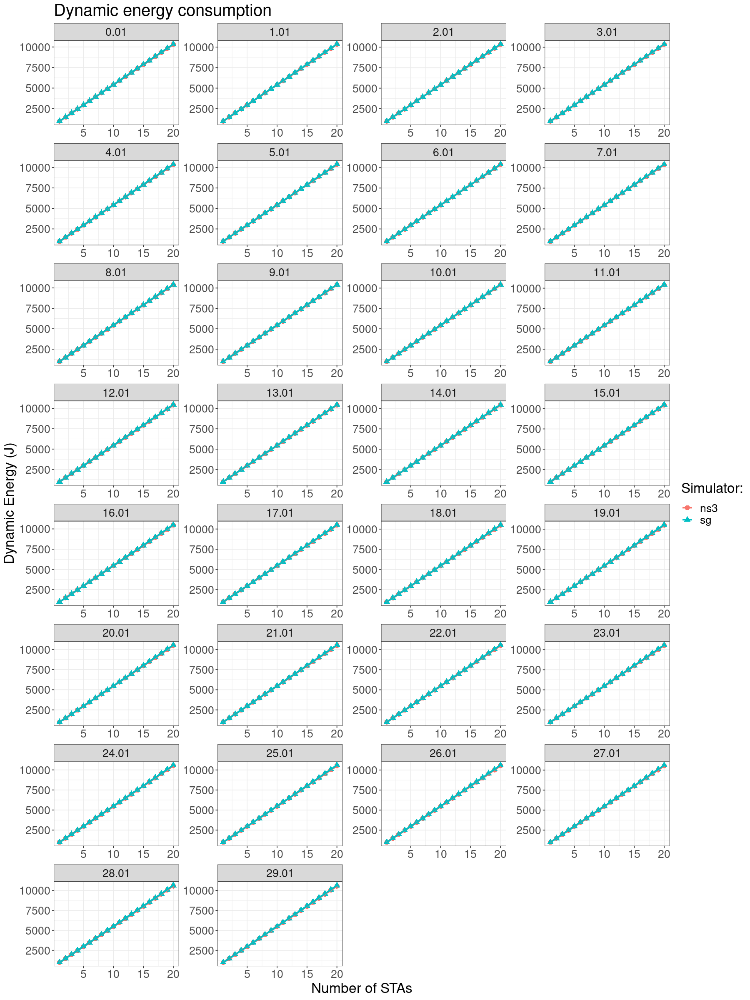

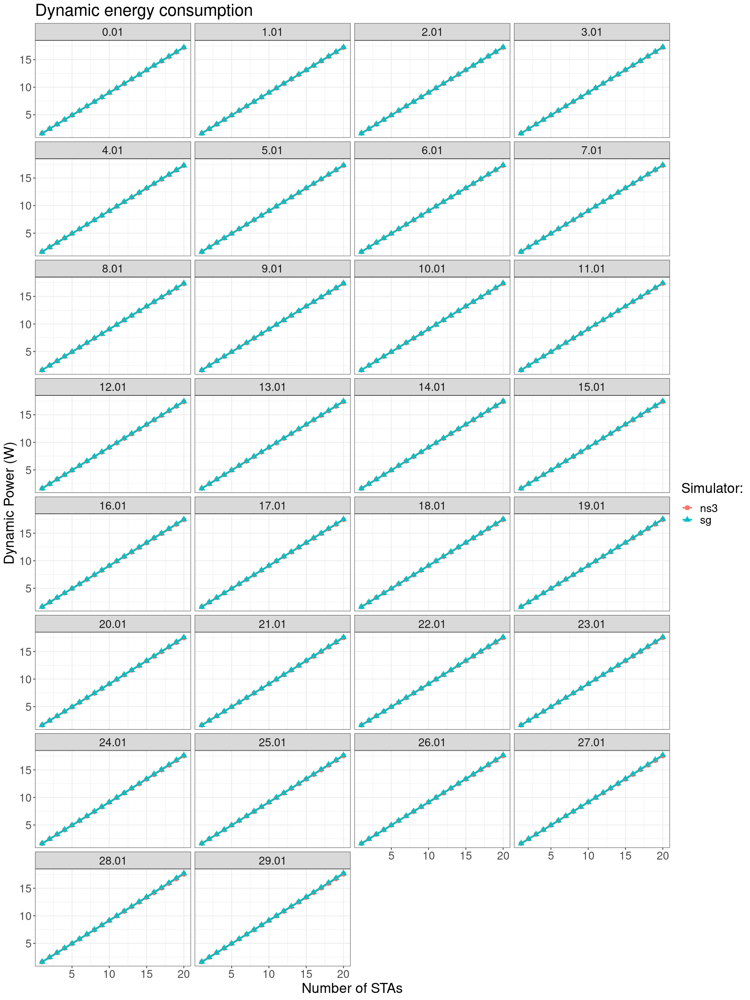

[1] 0.001484121


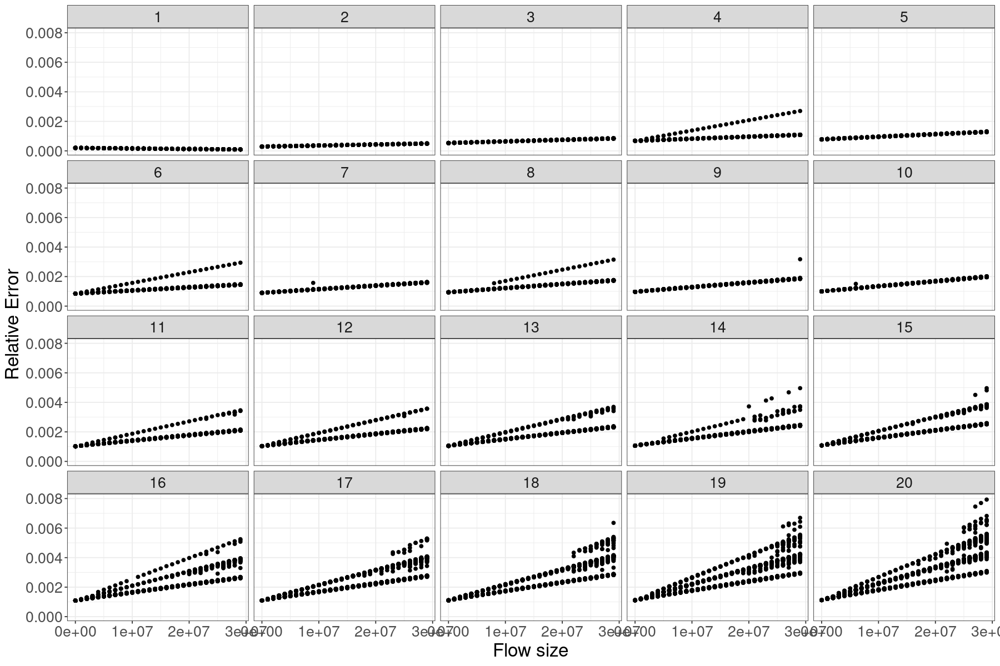

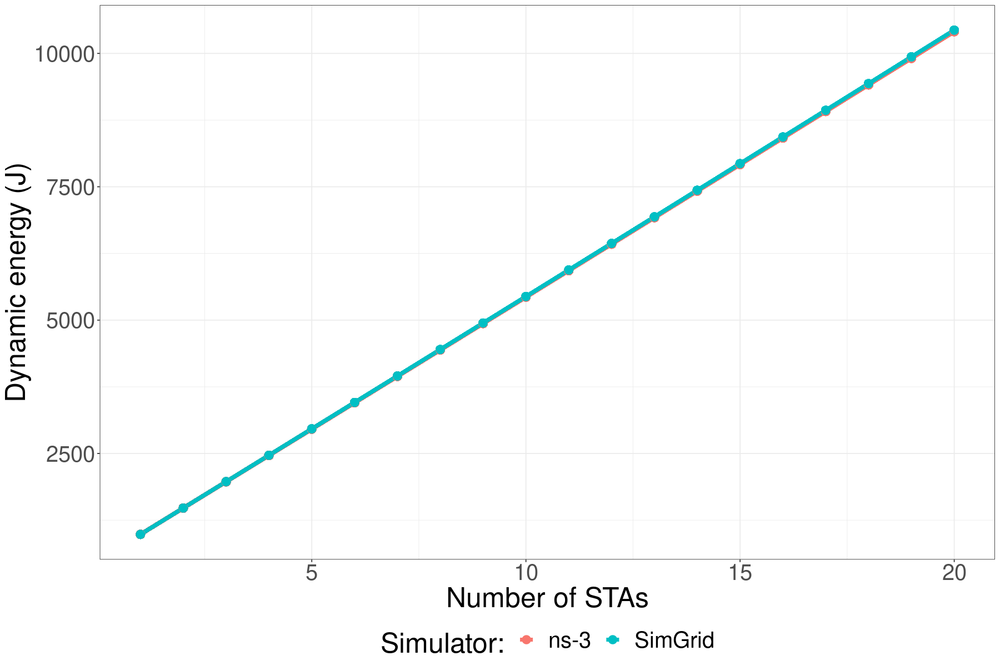

In [12]:
dir <- "./microbenchmarks/logs/"

d <- as_tibble(read.csv(paste(dir,"/results_1670017461_DEFAULT.csv",sep="")))

options(repr.plot.width=15, repr.plot.height=20)
g <- ggplot(data=d) +
  geom_point(aes(x=nSTA, y=totEnergyConsumption, group=interaction(simulator,factor(seed)), color=simulator, shape=simulator), size=3)+
  geom_line(aes(x=nSTA, y=totEnergyConsumption, group=interaction(simulator,factor(seed)), color=simulator), size=1)+
  facet_wrap(~(dataSize/1e+6), ncol=4, scales="free")+
  theme_bw()+
  theme(text = element_text(size = 20))+
  labs(y= "Dynamic Energy (J)", x = "Number of STAs", color='Simulator:', shape='Simulator:') +
  ggtitle("Dynamic energy consumption")
g

options(repr.plot.width=15, repr.plot.height=20)
g <- ggplot(data=d) +
  geom_point(aes(x=nSTA, y=totEnergyConsumption/simTime, group=interaction(simulator,factor(seed)), color=simulator, shape=simulator), size=3)+
  geom_line(aes(x=nSTA, y=totEnergyConsumption/simTime, group=interaction(simulator,factor(seed)), color=simulator), size=1)+
  facet_wrap(~(dataSize/1e+6), ncol=4)+
  theme_bw()+
  theme(text = element_text(size = 20))+
  labs(y= "Dynamic Power (W)", x = "Number of STAs", color='Simulator:', shape='Simulator:')+
  ggtitle("Dynamic energy consumption")
g


options(repr.plot.width=15, repr.plot.height=10)

dErr <- data.frame(matrix(ncol = 6, nrow = 0))
n <- c("dataSize","nSTA","sim1", "en1", "sim2","en2")
colnames(dErr) <- n
for( j in rownames(d) ){
    if(strtoi(j)%%2==0) next
    jn <- strtoi(j)
    dErr[nrow(dErr) + 1,] = c(as.numeric(d[jn,]$dataSize),as.numeric(d[jn,]$nSTA),d[jn,]$simulator,as.numeric(d[jn,]$totEnergyConsumption),d[jn+1,]$simulator,as.numeric(d[jn+1,]$totEnergyConsumption))
}
dErr$en1 <- as.numeric(dErr$en1)               # Third column is an integer
dErr$en2 <- as.numeric(dErr$en2)               # Third column is an integer
dErr$nSTA <- as.integer(dErr$nSTA)
dErr$dataSize <- as.integer(dErr$dataSize)

dErr <- dErr %>% mutate(relerr=abs((en2-en1)/(en1)))
g2 <- ggplot() + 
  geom_point(data=dErr, aes(x=dataSize, y=relerr))+
  facet_wrap(~nSTA)+
  theme_bw()+
  theme(text = element_text(size = 20))+
  labs(y= "Relative Error", x = "Flow size")
g2


print(mean(dErr$relerr))

d <- d %>% filter(dataSize==10010000)  %>% mutate(cleansimulator=ifelse(simulator=="ns3", "ns-3","SimGrid"))

options(repr.plot.width=15, repr.plot.height=10)
g <- ggplot(data=d, aes(x=nSTA, y=totEnergyConsumption, group=interaction(cleansimulator,seed), color=cleansimulator, fill=cleansimulator)) +
  geom_line(size=2, aes(color=cleansimulator))+geom_point(size=4, aes(color=cleansimulator))+
  labs(y= "Dynamic energy (J)", x = "Number of STAs", color='Simulator:', fill='Simulator:')+
  theme_bw()+
  theme(text = element_text(size = 30), legend.position = "bottom")
g

ggsave("power_up_tot.pdf", plot=g,width=15,height=10) #gsplit
embedFonts(file="power_up_tot.pdf", outfile="power_up_tot.pdf")


<a id="sc3"></a>
# Scenario 3: Pairs unidirectional

## Preview

![Scenario_preview](../scenarios/scenario_pairs_unidir.png)

The logs obtained by running this experiment are in the archive: `logs/1670029128.tar.xz`, the parsed results in `logs/results_1670029128_DEFAULT.csv`

## Settings

Launcher file name: `run_pairs_unidir.sh`

Launcher options:

```sh
bitRates="44.23Mbps" # bitRate in SimGrid in Mbps (obtained from the final plot>
useNS3=1
local_only=0
name="pairs_unidir"
useDecayModel=0
threshRTSCTS=100
seeds="$(seq 1 1 100)"
radiuses=15
simTimes="500"
corrF="0.002"
upDown=1
biDirection=0
cancelIDLEEnergy=1
pcap=0
mcs="HtMcs3"

dataSizes="$(seq 10000 1000000 25000000)"
topos=1
nNodes=0 # notused
nNodePairs="$(seq 1 1 10)"
```


## Results

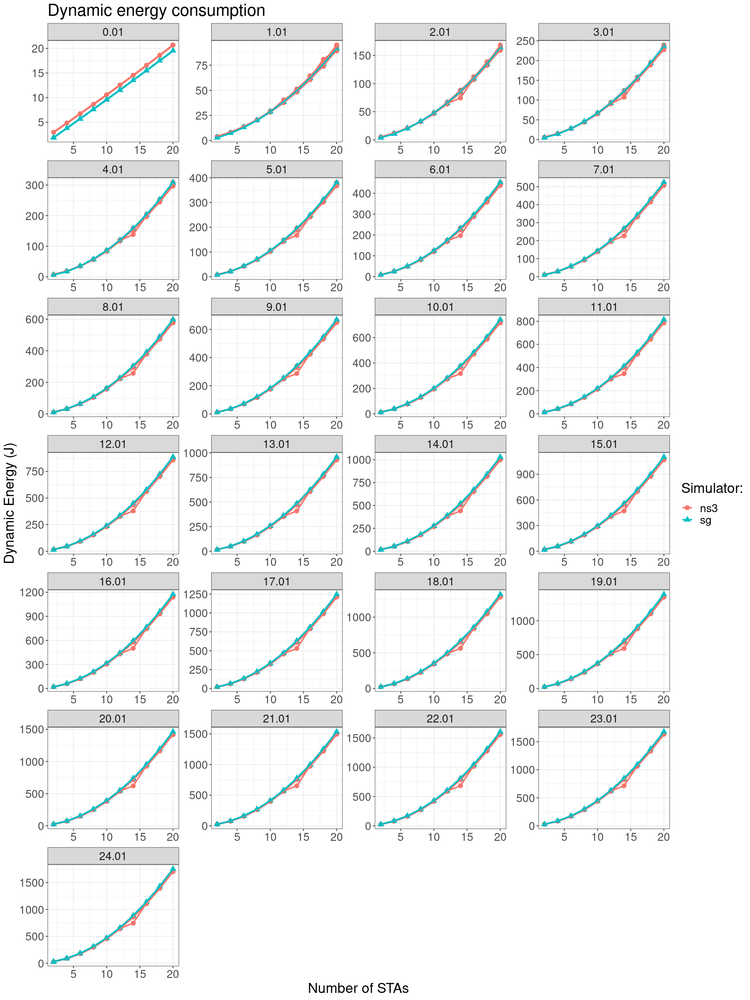

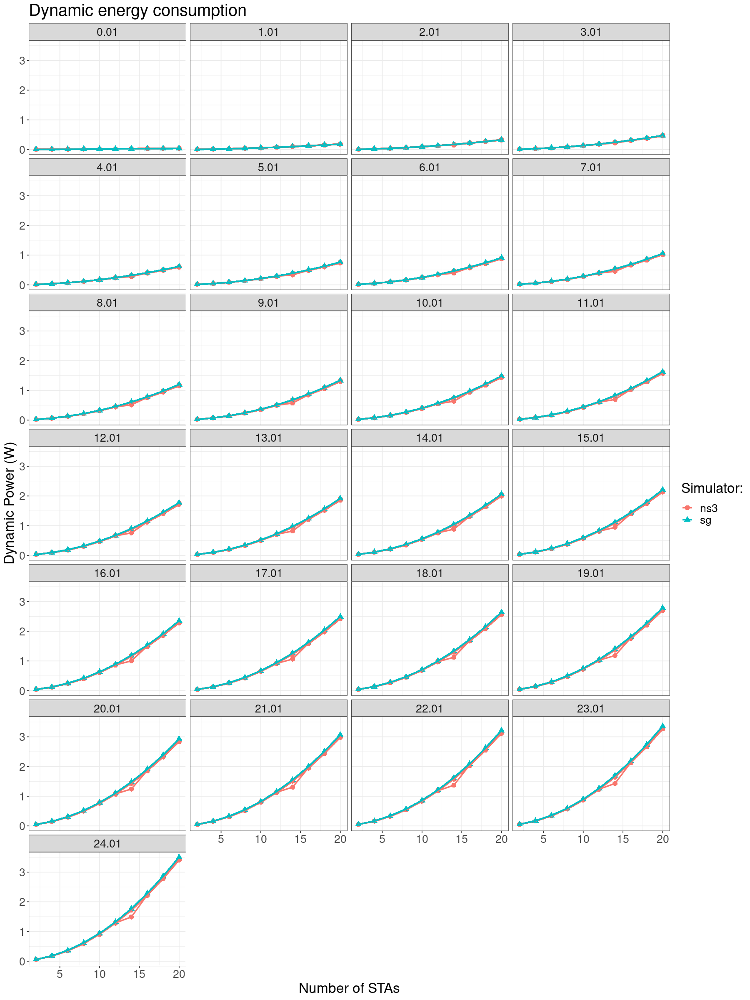

[1] 0.02936683


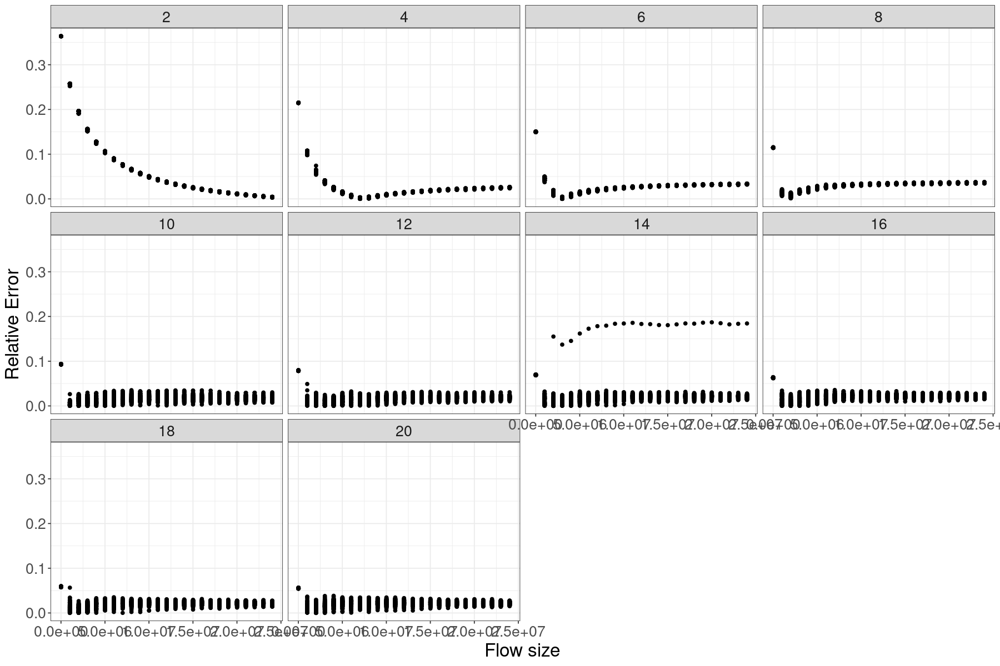

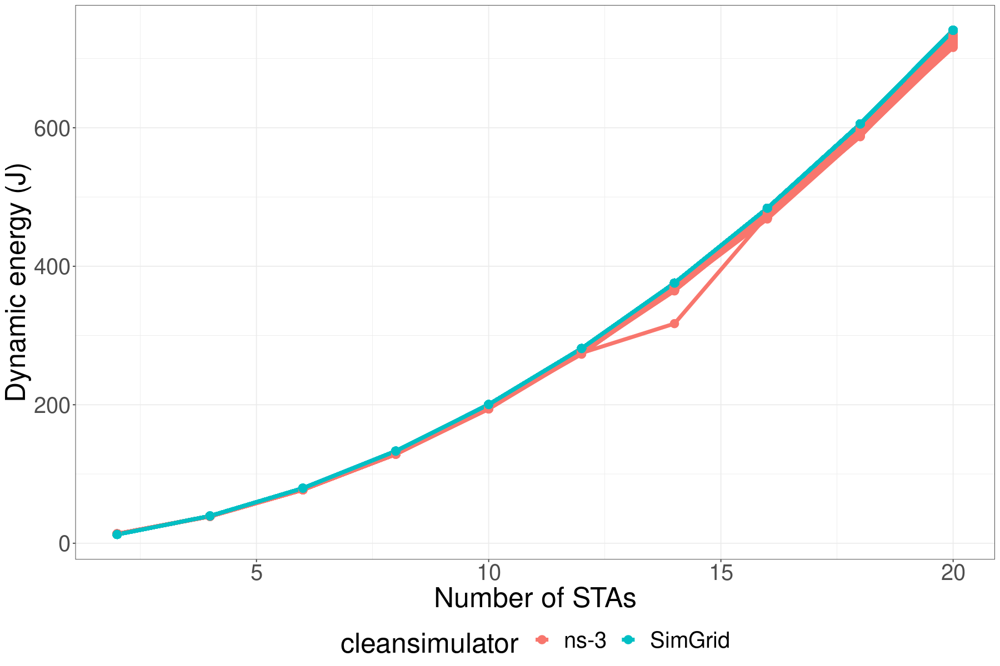

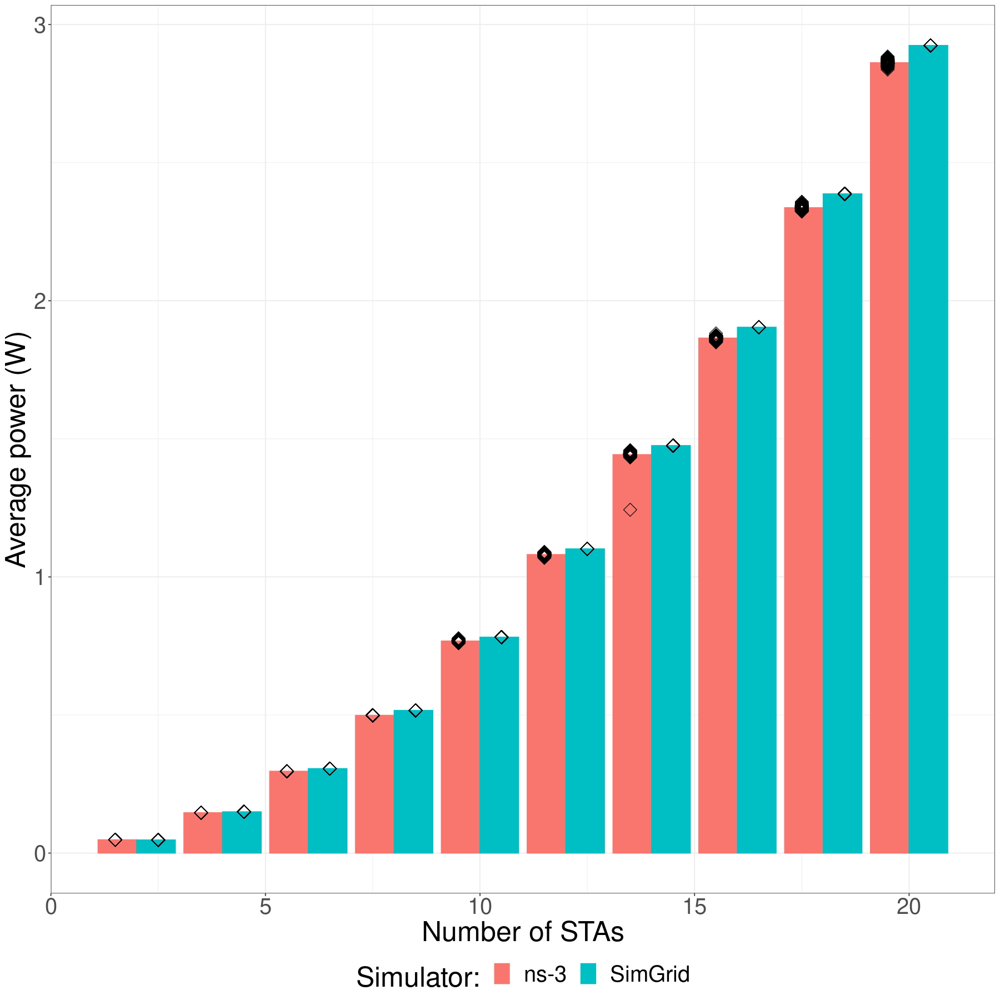

In [11]:
dir <- "./microbenchmarks/logs/"

d <- as_tibble(read.csv(paste(dir,"/results_1670029128_DEFAULT.csv",sep="")))

options(repr.plot.width=15, repr.plot.height=20)
g <- ggplot(data=d) +
  geom_point(aes(x=nSTA, y=totEnergyConsumption, group=interaction(simulator,factor(seed)), color=simulator, shape=simulator), size=3)+
  geom_line(aes(x=nSTA, y=totEnergyConsumption, group=interaction(simulator,factor(seed)), color=simulator), size=1)+
  facet_wrap(~(dataSize/1e+6), ncol=4, scales="free")+
  theme_bw()+
  theme(text = element_text(size = 20))+
  labs(y= "Dynamic Energy (J)", x = "Number of STAs", color='Simulator:', shape='Simulator:') +
  ggtitle("Dynamic energy consumption")
g

options(repr.plot.width=15, repr.plot.height=20)
g <- ggplot(data=d) +
  geom_point(aes(x=nSTA, y=totEnergyConsumption/simTime, group=interaction(simulator,factor(seed)), color=simulator, shape=simulator), size=3)+
  geom_line(aes(x=nSTA, y=totEnergyConsumption/simTime, group=interaction(simulator,factor(seed)), color=simulator), size=1)+
  facet_wrap(~(dataSize/1e+6), ncol=4)+
  theme_bw()+
  theme(text = element_text(size = 20))+
  labs(y= "Dynamic Power (W)", x = "Number of STAs", color='Simulator:', shape='Simulator:')+
  ggtitle("Dynamic energy consumption")
g


options(repr.plot.width=15, repr.plot.height=10)

dErr <- data.frame(matrix(ncol = 6, nrow = 0))
n <- c("dataSize","nSTA","sim1", "en1", "sim2","en2")
colnames(dErr) <- n
for( j in rownames(d) ){
    if(strtoi(j)%%2==0) next
    jn <- strtoi(j)
    dErr[nrow(dErr) + 1,] = c(as.numeric(d[jn,]$dataSize),as.numeric(d[jn,]$nSTA),d[jn,]$simulator,as.numeric(d[jn,]$totEnergyConsumption),d[jn+1,]$simulator,as.numeric(d[jn+1,]$totEnergyConsumption))
}
dErr$en1 <- as.numeric(dErr$en1)               # Third column is an integer
dErr$en2 <- as.numeric(dErr$en2)               # Third column is an integer
dErr$nSTA <- as.integer(dErr$nSTA)
dErr$dataSize <- as.integer(dErr$dataSize)

dErr <- dErr %>% mutate(relerr=abs((en2-en1)/(en1)))
g2 <- ggplot() + 
  geom_point(data=dErr, aes(x=dataSize, y=relerr))+
  facet_wrap(~nSTA)+
  theme_bw()+
  theme(text = element_text(size = 20))+
  labs(y= "Relative Error", x = "Flow size")
g2


print(mean(dErr$relerr))

d2 <- d %>% filter(dataSize==10010000) %>% mutate(cleansimulator=ifelse(simulator=="ns3", "ns-3","SimGrid"))

options(repr.plot.width=15, repr.plot.height=10)
g <- ggplot(data=d2, aes(x=nSTA, y=totEnergyConsumption, group=interaction(cleansimulator,seed), color=cleansimulator, fill=cleansimulator)) +
  geom_line(size=2, aes(color=cleansimulator))+geom_point(size=4, aes(color=cleansimulator))+
  labs(y= "Dynamic energy (J)", x = "Number of STAs")+
  theme_bw()+
  theme(text = element_text(size = 30), legend.position = "bottom")
g

#ggsave("power_pair_dyn.pdf", plot=g,width=15,height=10) #gsplit
#embedFonts(file="power_pair_dyn.pdf", outfile="power_up_dyn.pdf")

d2 <- d %>% filter(dataSize==20010000)
d2 <- d2 %>% mutate(power=totEnergyConsumption/simTime) %>% mutate(cleansimulator=ifelse(simulator=="ns3", "ns-3","SimGrid"))
df2 <- data_summary(d2, varname="power", 
                    groupnames=c("simulator","nSTA")) %>% mutate(cleansimulator=ifelse(simulator=="ns3", "ns-3","SimGrid"))

options(repr.plot.width=15, repr.plot.height=15)
g <- ggplot(data=df2, aes(x=nSTA, y=power, group=interaction(cleansimulator), color=cleansimulator, fill=cleansimulator)) +
  geom_bar( alpha=1, stat="identity", position=position_dodge()) +
  #geom_errorbar(aes(ymin=power-sd, ymax=power+sd), color="black", width=1, size=1.5, position=position_dodge(2))+
  geom_point(data=d2, aes(x=nSTA, y=power, group=interaction(cleansimulator)), alpha=1, fill=NA, color="black", size=5, shape =23, position = position_dodge(width = 2))+
  theme_bw()+
  theme(text = element_text(size = 30), legend.position = "bottom")+
  labs(y= "Average power (W)", x = "Number of STAs", color='Simulator:', fill='Simulator:')
g

ggsave("power_pairs_unidir.pdf", plot=g,width=15,height=9) #gsplit
embedFonts(file="power_pairs_unidir.pdf", outfile="power_pairs_unidir.pdf")



<a id="sc4"></a>
# Scenario 4: Pairs bidirectional

## Preview

![Scenario_preview](../scenarios/scenario_pairs_bidir.png)

The logs obtained by running this experiment are in the archive: `logs/1669844390.tar.xz`, the parsed results in `logs/results_1669844390_DEFAULT.csv`

## Settings

Launcher file name: `run_pairs_bidir.sh`

Launcher options:

```sh
bitRates="44.23Mbps" # bitRate in SimGrid in Mbps (obtained from the final plot>
useNS3=1
local_only=0
name="pairs_bidir"
useDecayModel=0
threshRTSCTS=100
seeds="$(seq 1 1 100)"
radiuses=15
simTimes="500"
corrF="0.002"
upDown=1
biDirection=1
cancelIDLEEnergy=1
pcap=0
mcs="HtMcs3"

dataSizes="$(seq 10000 1000000 25000000)"
topos=1
nNodes=0 # notused
nNodePairs="$(seq 1 1 10)"
```


## Results

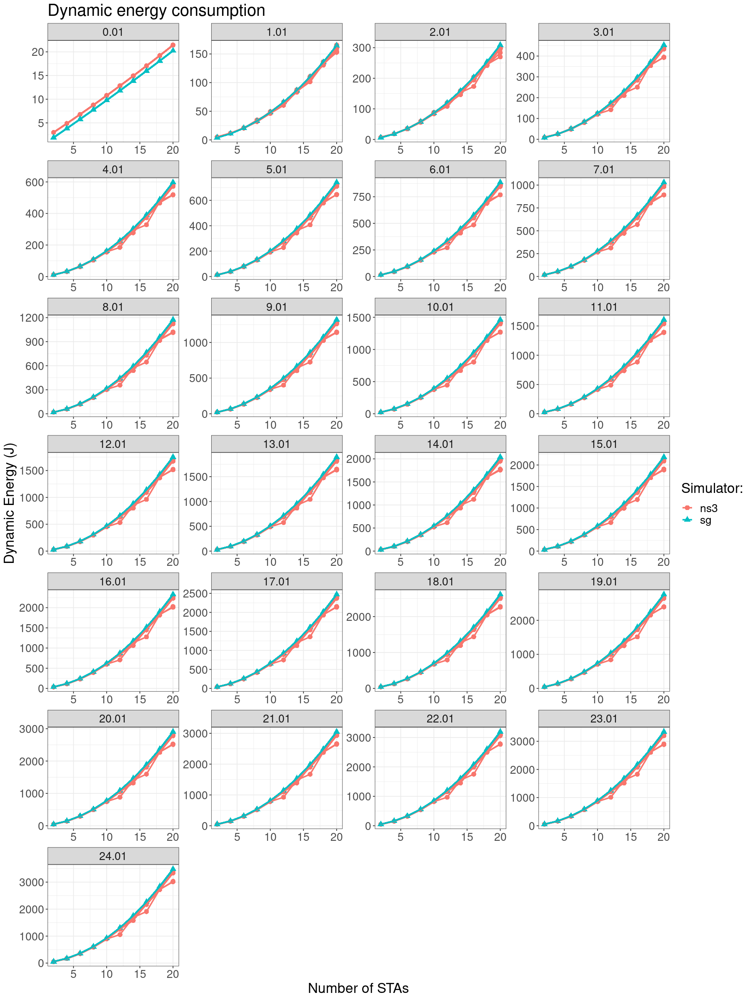

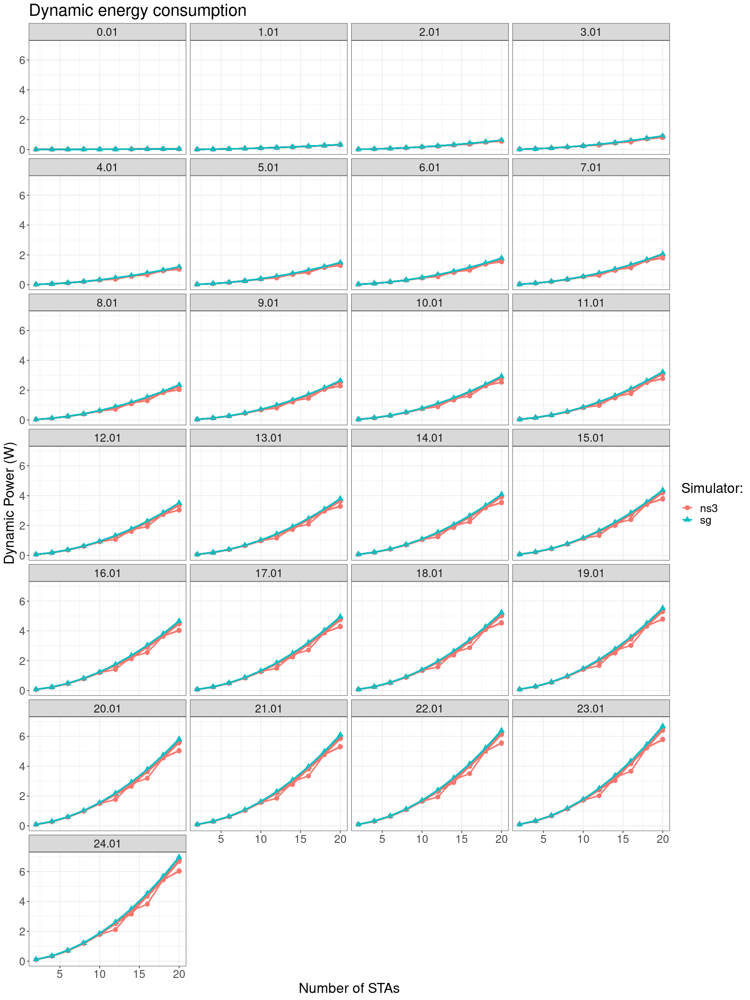

[1] 0.03476454


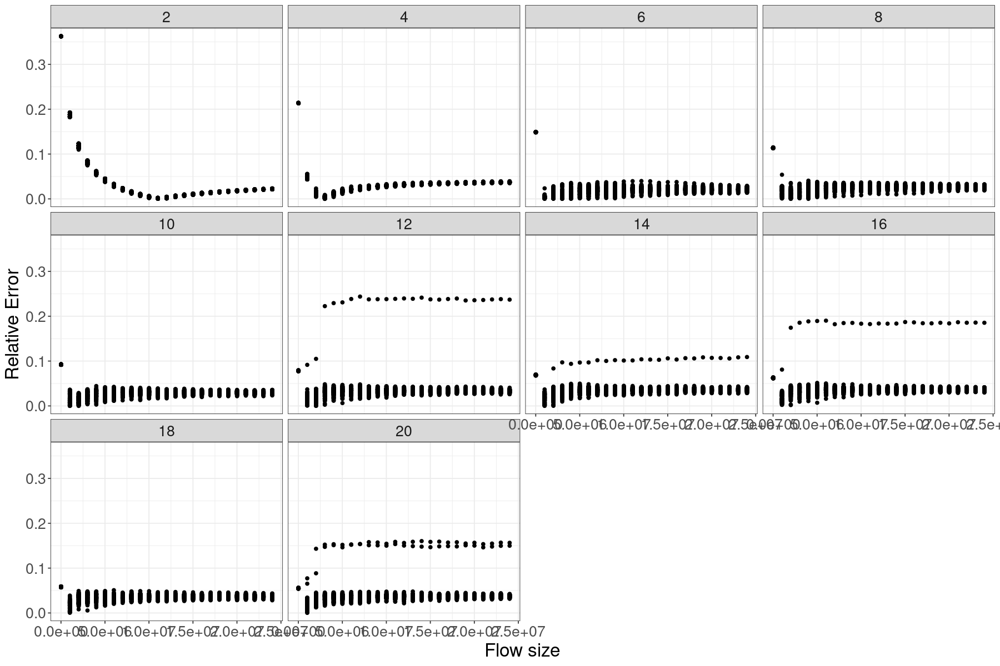

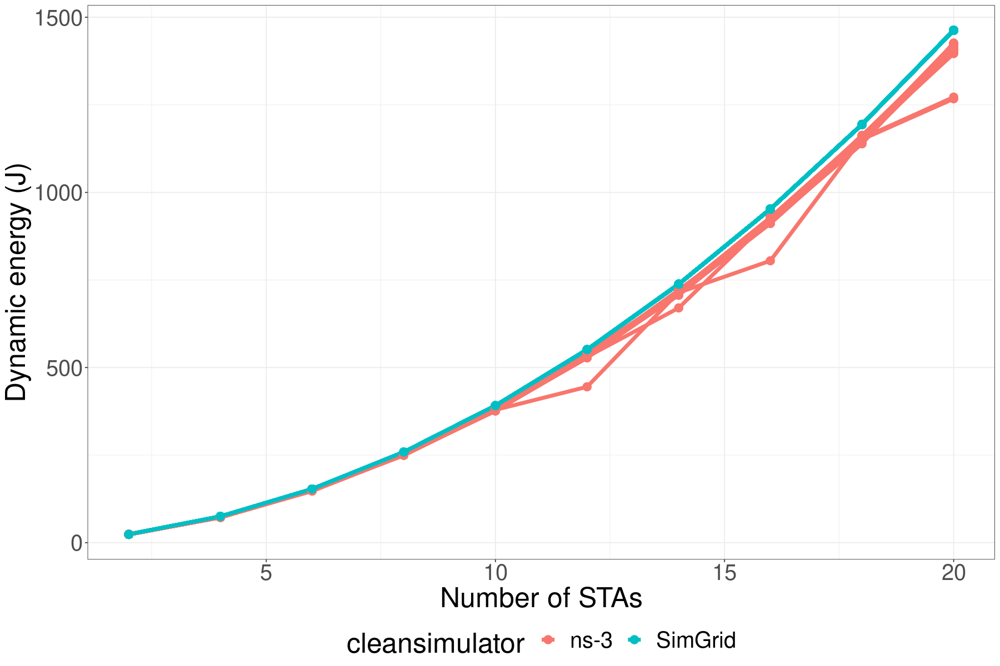

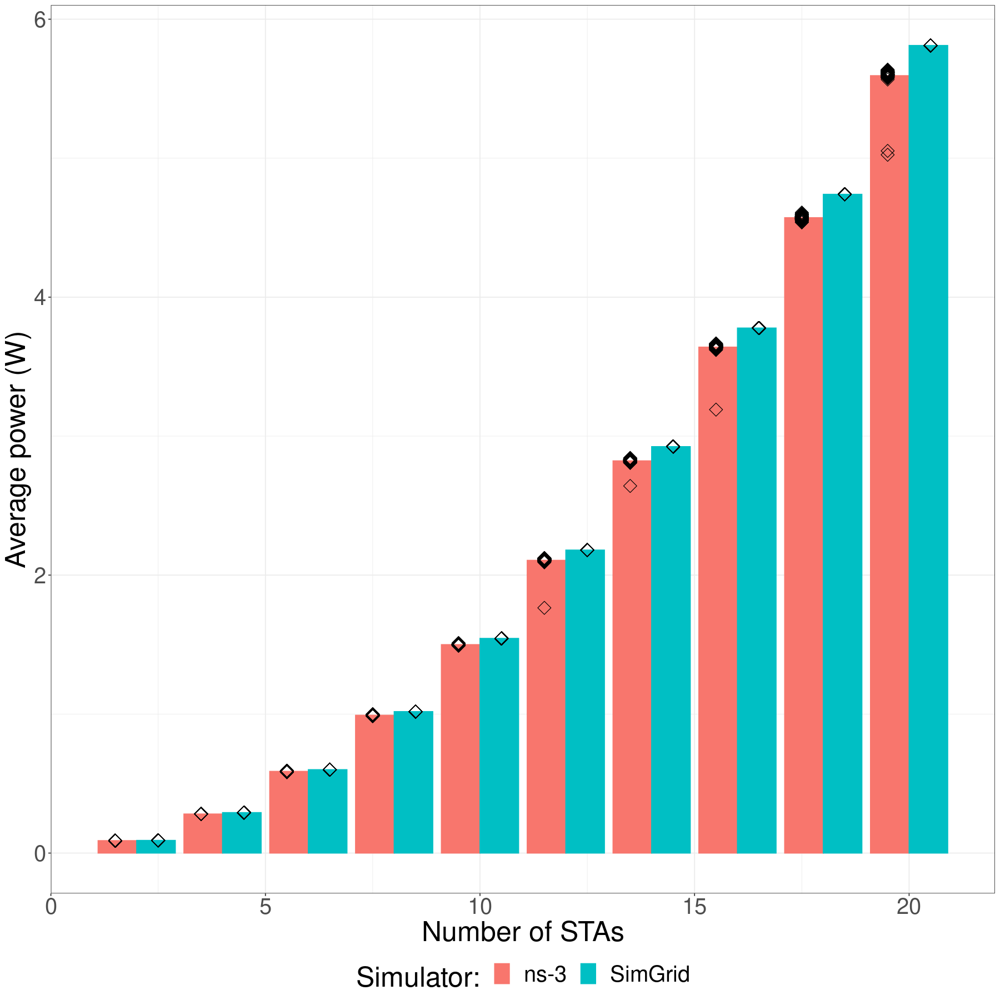

In [10]:
dir <- "./microbenchmarks/logs/"

d <- as_tibble(read.csv(paste(dir,"/results_1669844390_DEFAULT.csv",sep="")))

options(repr.plot.width=15, repr.plot.height=20)
g <- ggplot(data=d) +
  geom_point(aes(x=nSTA, y=totEnergyConsumption, group=interaction(simulator,factor(seed)), color=simulator, shape=simulator), size=3)+
  geom_line(aes(x=nSTA, y=totEnergyConsumption, group=interaction(simulator,factor(seed)), color=simulator), size=1)+
  facet_wrap(~(dataSize/1e+6), ncol=4, scales="free")+
  theme_bw()+
  theme(text = element_text(size = 20))+
  labs(y= "Dynamic Energy (J)", x = "Number of STAs", color='Simulator:', shape='Simulator:') +
  ggtitle("Dynamic energy consumption")
g

options(repr.plot.width=15, repr.plot.height=20)
g <- ggplot(data=d) +
  geom_point(aes(x=nSTA, y=totEnergyConsumption/simTime, group=interaction(simulator,factor(seed)), color=simulator, shape=simulator), size=3)+
  geom_line(aes(x=nSTA, y=totEnergyConsumption/simTime, group=interaction(simulator,factor(seed)), color=simulator), size=1)+
  facet_wrap(~(dataSize/1e+6), ncol=4)+
  theme_bw()+
  theme(text = element_text(size = 20))+
  labs(y= "Dynamic Power (W)", x = "Number of STAs", color='Simulator:', shape='Simulator:')+
  ggtitle("Dynamic energy consumption")
g


options(repr.plot.width=15, repr.plot.height=10)

dErr <- data.frame(matrix(ncol = 6, nrow = 0))
n <- c("dataSize","nSTA","sim1", "en1", "sim2","en2")
colnames(dErr) <- n
for( j in rownames(d) ){
    if(strtoi(j)%%2==0) next
    jn <- strtoi(j)
    dErr[nrow(dErr) + 1,] = c(as.numeric(d[jn,]$dataSize),as.numeric(d[jn,]$nSTA),d[jn,]$simulator,as.numeric(d[jn,]$totEnergyConsumption),d[jn+1,]$simulator,as.numeric(d[jn+1,]$totEnergyConsumption))
}
dErr$en1 <- as.numeric(dErr$en1)               # Third column is an integer
dErr$en2 <- as.numeric(dErr$en2)               # Third column is an integer
dErr$nSTA <- as.integer(dErr$nSTA)
dErr$dataSize <- as.integer(dErr$dataSize)

dErr <- dErr %>% mutate(relerr=abs((en2-en1)/(en1)))
g2 <- ggplot() + 
  geom_point(data=dErr, aes(x=dataSize, y=relerr))+
  facet_wrap(~nSTA)+
  theme_bw()+
  theme(text = element_text(size = 20))+
  labs(y= "Relative Error", x = "Flow size")
g2


print(mean(dErr$relerr))

d2 <- d %>% filter(dataSize==10010000)  %>% mutate(cleansimulator=ifelse(simulator=="ns3", "ns-3","SimGrid"))

options(repr.plot.width=15, repr.plot.height=10)
g <- ggplot(data=d2, aes(x=nSTA, y=totEnergyConsumption, group=interaction(cleansimulator,seed), color=cleansimulator, fill=cleansimulator)) +
  geom_line(size=2, aes(color=cleansimulator))+geom_point(size=4, aes(color=cleansimulator))+
  labs(y= "Dynamic energy (J)", x = "Number of STAs")+
  theme_bw()+
  theme(text = element_text(size = 30), legend.position = "bottom")
g

#ggsave("power_pair_dyn.pdf", plot=g,width=15,height=10) #gsplit
#embedFonts(file="power_pair_dyn.pdf", outfile="power_up_dyn.pdf")

d2 <- d %>% filter(dataSize==20010000) %>% mutate(cleansimulator=ifelse(simulator=="ns3", "ns-3","SimGrid"))
d2 <- d2 %>% mutate(power=totEnergyConsumption/simTime)
df2 <- data_summary(d2, varname="power", 
                    groupnames=c("simulator","nSTA")) %>% mutate(cleansimulator=ifelse(simulator=="ns3", "ns-3","SimGrid"))

options(repr.plot.width=15, repr.plot.height=15)
g <- ggplot(data=df2, aes(x=nSTA, y=power, group=interaction(cleansimulator), color=cleansimulator, fill=cleansimulator)) +
  geom_bar( alpha=1, stat="identity", position=position_dodge()) +
  #geom_errorbar(aes(ymin=power-sd, ymax=power+sd), color="black", width=1, size=1.5, position=position_dodge(2))+
  geom_point(data=d2, aes(x=nSTA, y=power, group=interaction(cleansimulator)), alpha=1, fill=NA, color="black", size=5, shape =23, position = position_dodge(width = 2))+
  theme_bw()+
  theme(text = element_text(size = 30), legend.position = "bottom")+
  labs(y= "Average power (W)", x = "Number of STAs", color='Simulator:', fill='Simulator:')
g

ggsave("power_pairs_bidir.pdf", plot=g,width=15,height=9) #gsplit
embedFonts(file="power_pairs_bidir.pdf", outfile="power_pairs_bidir.pdf")



<a id="sc5"></a>
# Scenario 5: Simplemix

## Preview

![Scenario_preview](../scenarios/scenario_simplemix.png)

The logs obtained by running this experiment are in the archive: `logs/1669852990.tar.xz`, the parsed results in `logs/results_1669852990_DEFAULT.csv`

## Settings

Launcher file name: `run_pairs_bidir.sh`

Launcher options:

```sh
bandwidth="35Mbps" # bitRate in SimGrid in Mbps (obtained from the final plot o>
useNS3=1
local_only=0
name="simplemix"
useDecayModel=0
#threshRTSCTS=100 a rajouter
seeds="$(seq 1 1 40)"
simTimes="$(seq 700 200 1100)"
corrF="0.002"
cancelIDLEEnergy=1
mcs="HtMcs3"
verbose="0"

flowSizes=$(seq 3000000 1000000 20000000)
nNodesPerWLanS="$(seq 1 1 10)"
```


## Results

[1] 0.04367597


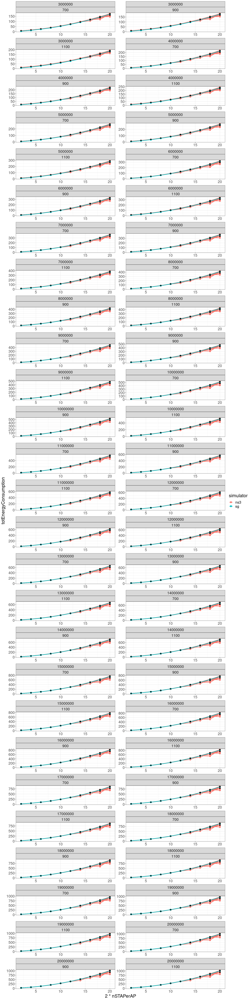

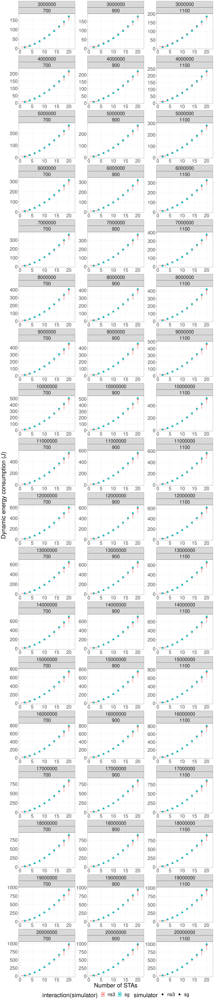

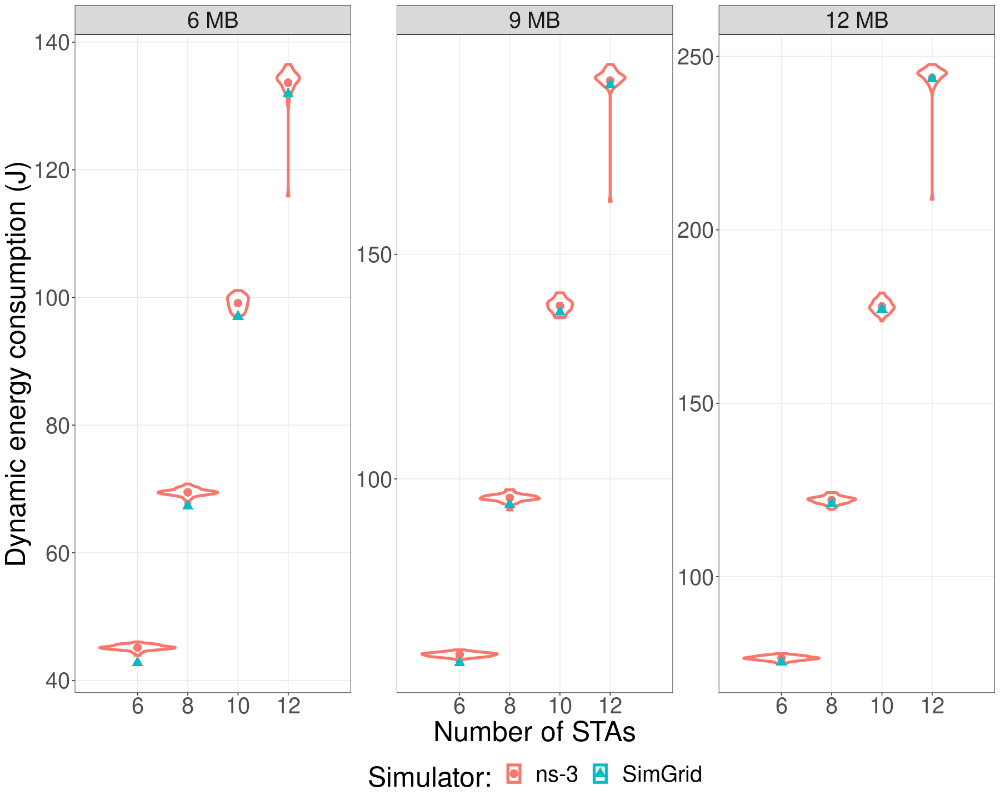

In [8]:
options(warn=-1) 
dir <- "./microbenchmarks/logs/"

d <- as_tibble(read.csv(paste(dir,"/results_1669852990_DEFAULT.csv",sep="")))

dtmp <- d %>% filter(simulator=="ns3")
dsummary <- data_summary(dtmp, varname="totEnergyConsumption", groupnames=c("simulator","nSTAPerAP","dataSize","simTime")) # standard deviation for errorbar

options(repr.plot.width=15, repr.plot.height=60)
g <- ggplot(data=d) +
  geom_point(aes(x=2*nSTAPerAP, y=totEnergyConsumption, color=simulator, group=interaction(simulator,seed)), size=3)+
  geom_line(aes(x=2*nSTAPerAP, y=totEnergyConsumption, color=simulator, group=interaction(simulator,seed)), size=1)+
  geom_errorbar(data=dsummary, aes(x=2*nSTAPerAP, ymin=totEnergyConsumption-sd, ymax=totEnergyConsumption+sd), position=position_dodge(.9), size=1.5, width=.3)+
  theme_bw()+
  theme(text = element_text(size = 20))+
  facet_wrap(~dataSize+simTime, ncol=2,scales="free")
g

options(repr.plot.width=15, repr.plot.height=80)

g <- ggplot(data=d) +
  geom_point(aes(x=dataSize, y=totEnergyConsumption, color=simulator), size=3)+
  geom_line(aes(x=dataSize, y=totEnergyConsumption, color=simulator), size=1)+
  geom_errorbar(data=dsummary, aes(x=dataSize, ymin=totEnergyConsumption-sd, ymax=totEnergyConsumption+sd), position=position_dodge(.9), size=1.5, width=.3)+
  theme_bw()+
  theme(text = element_text(size = 20))+
  facet_wrap(~2*nSTAPerAP+simTime)
#g

options(repr.plot.width=15, repr.plot.height=10)

dErr <- data.frame(matrix(ncol = 6, nrow = 0))
n <- c("dataSize","nSTAPerAP","sim1", "en1", "sim2","en2")
colnames(dErr) <- n
for( j in rownames(d) ){
    if(strtoi(j)%%2==0) next
    jn <- strtoi(j)
    dErr[nrow(dErr) + 1,] = c(as.numeric(d[jn,]$dataSize),as.numeric(d[jn,]$nSTAPerAP),d[jn,]$simulator,as.numeric(d[jn,]$totEnergyConsumption),d[jn+1,]$simulator,as.numeric(d[jn+1,]$totEnergyConsumption))
}
dErr$en1 <- as.numeric(dErr$en1)               # Third column is an integer
dErr$en2 <- as.numeric(dErr$en2)               # Third column is an integer
dErr$nSTA <- as.integer(dErr$nSTA)
dErr$dataSize <- as.integer(dErr$dataSize)

dErr <- dErr %>% mutate(relerr=abs((en2-en1)/(en1)))

print(mean(dErr$relerr))

options(repr.plot.width=15, repr.plot.height=70)
g <- ggplot(data=d, aes(x=2*nSTAPerAP, y=totEnergyConsumption,color=interaction(simulator), group=interaction(simulator, nSTAPerAP, dataSize))) +
  geom_violin(position = position_dodge(width = 0), size=1, width=6)+
  stat_summary(aes(shape=simulator),fun=mean, geom="point", size=4)+
  theme_bw()+scale_fill_brewer(palette="Dark2")+
  theme(text = element_text(size = 30), legend.position = "bottom", panel.grid.minor = element_blank())+
  facet_wrap(~dataSize+simTime,scales="free", ncol=3)+
  labs(y= "Dynamic energy consumption (J)", x = "Number of STAs")
g


d <- d%>% filter(simTime==900) %>% filter(dataSize == 6000000  | dataSize == 9000000 | dataSize == 12000000) %>% filter(nSTAPerAP >2 & nSTAPerAP <=6) %>% mutate(cleansimulator=ifelse(simulator=="ns3", "ns-3","SimGrid"))

options(repr.plot.width=15, repr.plot.height=12)
g <- ggplot(data=d, aes(x=2*nSTAPerAP, y=totEnergyConsumption,color=interaction(cleansimulator), group=interaction(cleansimulator, nSTAPerAP, dataSize))) +
  geom_violin(position = position_dodge(width = 0), size=1.5, width=6)+
  stat_summary(aes(shape=cleansimulator),fun.y=mean, geom="point", size=4)+
  theme_bw()+scale_fill_brewer(palette="Dark2")+
  theme(text = element_text(size = 30), legend.position = "bottom", panel.grid.minor = element_blank())+
  facet_wrap(~factor(paste(dataSize/1000000,"MB"), levels=c("6 MB","9 MB","12 MB")),scales="free", nrow=1)+
  labs(y= "Dynamic energy consumption (J)", x = "Number of STAs", color='Simulator:', shape='Simulator:')+
  scale_x_continuous(limits = c(4, 14),breaks = seq(6, 12, by = 2))
g

ggsave("energy_heterogeneous_v.pdf", plot=g,width=15,height=12) #gsplit
embedFonts(file="energy_heterogeneous_v.pdf", outfile="energy_heterogeneous_v.pdf")


